<a id="content"></a>
# Contents:
1. 
2. [Считаем lifetime через MRC](#calc-mrc)
2. [Извлекаем фрагменты. Замена на константу](#method1)
3. [Извлекаем фрагменты. Сглаживание](#method2)

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
import math
import bisect

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"]})

In [6]:
data = pd.read_csv('data/DeBilt.dat', '\s+')
data.columns = ["year", "month", "day", "val"]

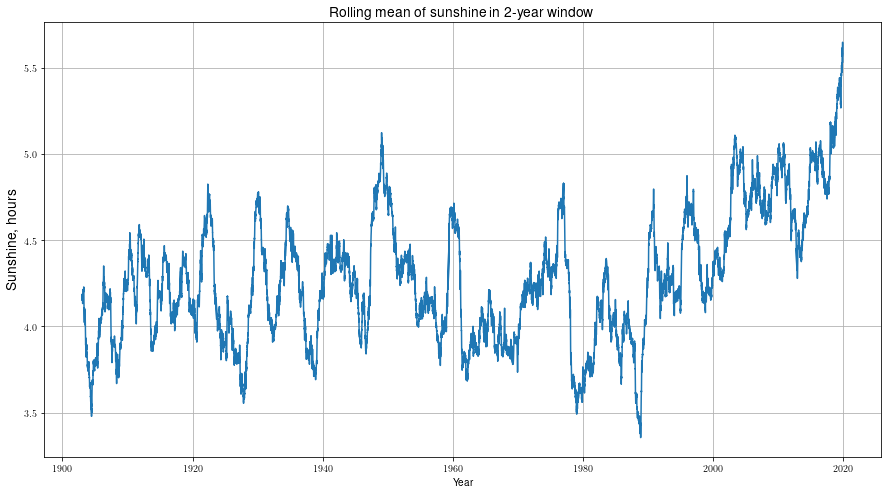

In [8]:
plt.figure(figsize=(15, 8))
plt.grid(True)
plt.title('Rolling mean of sunshine in 2-year window', fontsize=14)
plt.ylabel('Sunshine, hours', fontsize=14)
plt.xlabel('Year')
plt.plot(np.linspace(data.loc[0, 'year'], data.loc[data.shape[0]-1, 'year'], data.shape[0]), data['val'].rolling(2 * 365).mean())

In [3]:
data

,year,month,day,val
0,1901,1,3,0.0
1,1901,1,4,0.0
2,1901,1,5,3.6
3,1901,1,6,6.1
4,1901,1,7,2.8
...,...,...,...,...
43615,2020,7,2,5.7
43616,2020,7,3,7.4
43617,2020,7,4,0.1
43618,2020,7,5,4.0


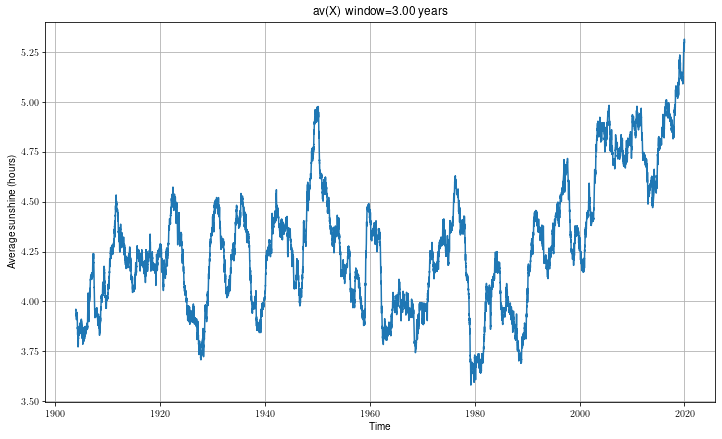

In [31]:
plot_average(data, 365*3)

All tests passed


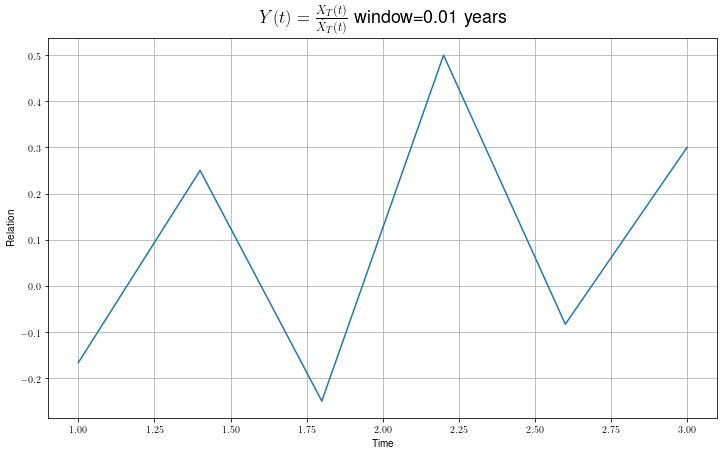

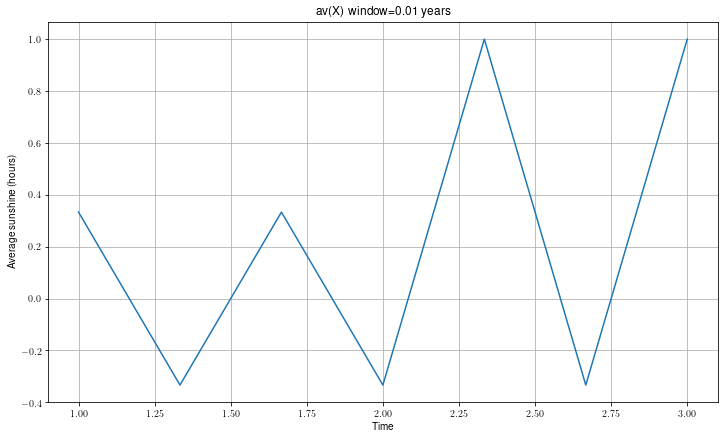

In [7]:
def build_averaged_values_arr(arr, window_size):
    n = len(arr)
    av = np.zeros(n)
    cur_sum = sum(arr[:window_size - 1])
    for i in range(window_size - 1, n):
        cur_sum += arr[i]
        if i - window_size >= 0:
            cur_sum -= arr[i - window_size]
        av[i] = cur_sum / window_size
    return av

def build_averaged_values(df, window_size):
    n = df.shape[0]
    av = np.zeros(n)
    cur_sum = sum(df.loc[:window_size - 2, 'val'])
    for i in range(window_size - 1, n):
        cur_sum += df.loc[i, 'val']
        if i - window_size >= 0:
            cur_sum -= df.loc[i - window_size, 'val']
        av[i] = cur_sum / window_size
    return av

def __test_build_averaged_values():
    df = pd.DataFrame({
        'val': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
    })
    window_size = 3
    eps = 10**(-5)
    averaged = build_averaged_values(df, 3)
    assert len(averaged) == 10, "wrong size of average array"
    assert abs(averaged[0]) < eps, 'incorrect average, elem 0'
    assert abs(averaged[2] - 2) < eps, 'incorrect average, elem 2 is ' + str(averaged[2])
    assert abs(averaged[9] - 9) < eps, 'incorrect average, elem 9'
        
def eq(x, y):
    eps = 10**(-5)
    return abs(x - y) < eps
    
def build_derivatives(df):
    #df['averaged_values'] = build_averaged_values(df, window_size)
    n = df.shape[0]
    deriv = np.zeros(n)
    for i in range(1, n):
        if 'year' not in df or df.loc[i, 'year'] == df.loc[i - 1, 'year']:
            deriv[i] = df.loc[i, 'val'] - df.loc[i - 1, 'val']
    return deriv

def __test_build_derivatives():
    df = pd.DataFrame({
        'val':  [1, 4, 9, 16, 25, 36, 49, 64, 81, 100],
        'year': [0, 0, 0,  0,  1,  1,  1,  1,  1,    1]
    })
    window_size = 3
    #avs = [0, 0, 14/3, 29/3, 50/3, 77/3, 110/3, 149/3, 194/3, 245/3]
    expected = [0, 3, 5, 7, 0, 11, 13, 15, 17, 19]
    actual = build_derivatives(df)
    for i in range(10):
        assert eq(expected[i], actual[i]), "derivative at i=" + str(i) + " is incorrect " + "actual=" + str(actual[i])+" expected=" + str(expected[i])
    

def build_relation(df, window_size):
    averaged_values = build_averaged_values(df, window_size)[window_size:]
    derivatives = np.abs(build_derivatives(df))[1:]
    average_derivatives = build_averaged_values_arr(derivatives, window_size)[window_size - 1:]
    # TODO : add some null checks and processing
    n = df.shape[0]
    result = np.zeros(n)
    result[window_size:] = averaged_values / average_derivatives
    return result

def __test_build_relation():
    df = pd.DataFrame({
        'val': [1, -1, 1, -1, 1, -1, 3, -3, 3]
    })
    window_size=3
    #avs = [0, 0, 1/3, -1/3, 1/3, -1/3, 1, -1/3, 1]
    #der = [0, 2,   2,    2,   2,    2,  4,   6,  6]
    #avder=[0, 0,   0,    2,   2,    2,8/3,   4, 16/3]
    expected = [0, 0, 0, -1/6, 1/6, -1/6, 3/8, -1/12, 3/16]
    actual = build_relation(df, window_size)
    for i in range(9):
        assert eq(expected[i], actual[i]), "relation at i=" + str(i) + " is incorrect " + "actual=" + str(actual[i])+" expected=" + str(expected[i])
    
    
def make_dates(df):
    transformer = lambda dt: datetime.date(int(dt['year']), int(dt['month']), int(dt['day'])).toordinal() 
    df['date_in_days'] = df.apply(transformer, axis=1)

def plot_relation(df, window_size):
    df['relation'] = build_relation(df, window_size)
    plt.figure(figsize=(12, 7))
    plt.grid(True)
    s = r'$Y(t) = \frac{X_T(t)}{\dot{X}_T(t)}$'
    s += " window=" + "{:.2f}".format(window_size/365) + " years"
    plt.title(s, fontsize=18)
    plt.xlabel('Time')
    plt.ylabel('Relation')
    n = df.shape[0]
    years = np.linspace(df.loc[window_size, 'year'], df.loc[n - 1, 'year'], n - window_size)
    plt.plot(years, df.loc[window_size:, 'relation'])
    
def __test_plot_relation():
    df = pd.DataFrame({
        'val': [1, -1, 1, -1, 1, -1, 3, -3, 3],
        'year': [1, 1, 1, 1, 2, 2, 2, 2, 3]
    })
    plot_relation(df, 3)
    
def plot_average(df, window_size):
    average = build_averaged_values(df, window_size)
    plt.figure(figsize=(12, 7))
    plt.grid(True)
    plt.title('av(X) window=' + "{:.2f}".format(window_size/365) + " years")
    plt.xlabel('Time')
    plt.ylabel('Average sunshine (hours)')
    n = df.shape[0]
    years = np.linspace(df.loc[window_size - 1, 'year'], df.loc[n - 1, 'year'], n - window_size + 1)
    plt.plot(years, average[window_size-1:])

    
def __test_plot_average():
    df = pd.DataFrame({
        'val': [1, -1, 1, -1, 1, -1, 3, -3, 3],
        'year': [1, 1, 1, 1, 2, 2, 2, 2, 3],
        'month': [4, 4, 4, 4 ,4 ,4, 4, 4, 4]
    })
    plot_average(df, 3)
    
def plot_deriv(df, window_size):
    deriv = abs(build_derivatives(df, window_size))
    plt.figure(figsize=(12, 7))
    plt.grid(True)
    plt.title('|av\'(X)| window=' + "{:.2f}".format(window_size/365) + " years")
    plt.xlabel('Time')
    plt.ylabel('Abs of derivative')
    n = df.shape[0]
    years = np.linspace(df.loc[window_size, 'year'], df.loc[n - 1, 'year'], n - window_size)
    plt.plot(years, deriv[window_size:])
    
def test_all():
    __test_build_averaged_values()
    __test_build_derivatives()
    __test_build_relation()
    __test_plot_relation()
    __test_plot_average()
    print("All tests passed")
    
test_all()

Модель с модулированным шумом:
\begin{align}
& X(t) = \eta(t)\sin(wt)+c \\
& \eta(t) = \alpha\eta(t - 1) + \xi(t) \\
& \xi \sim U(0, 1) \\
\end{align}

\begin{align}
& X'(t) = x_t - x_{t-1} \\
& \dot{X}_T(t) = X'_T(t) = \dfrac{1}{T} \sum_{i = t - T + 1}^t |X'(i)|\\
& X_T(t) = \dfrac{1}{T}\sum_{i = t - T + 1}^tx_i \\
& Y(t) = \dfrac{X_T(t)}{|X'_T(t)|} \approx \dfrac{1}{1 - \alpha}
\end{align}

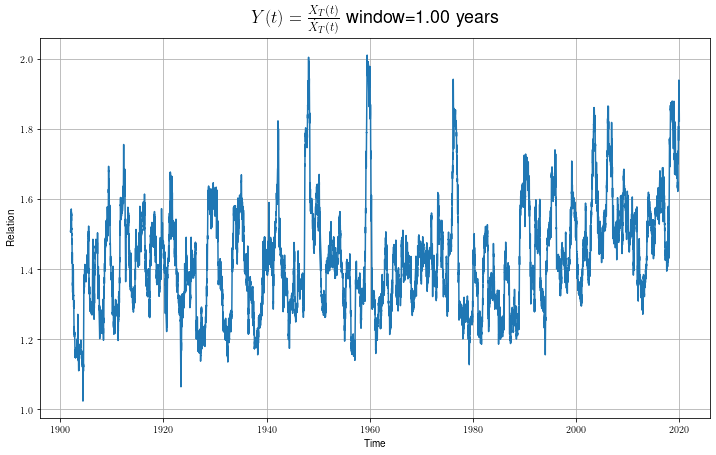

In [ ]:
plot_relation(data, window_size=365)

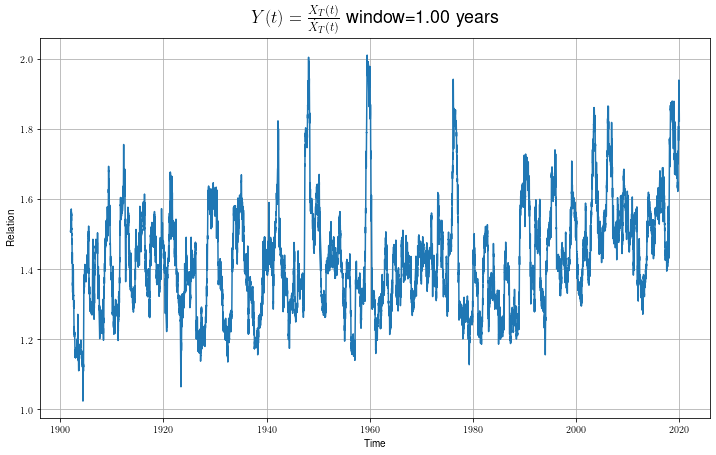

In [ ]:
plot_relation(data, window_size=365)

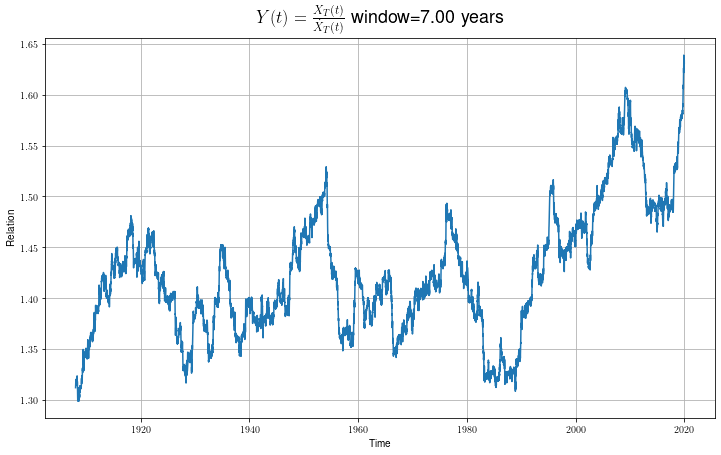

In [ ]:
# 7 years 
plot_relation(data, window_size=7*365)

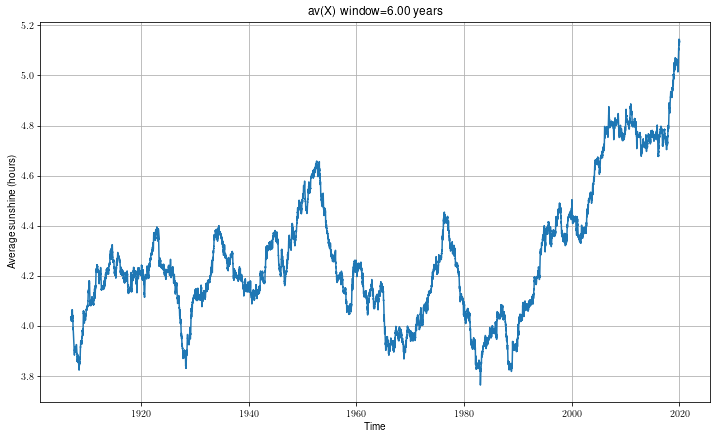

In [ ]:
plot_average(data, 365*6)

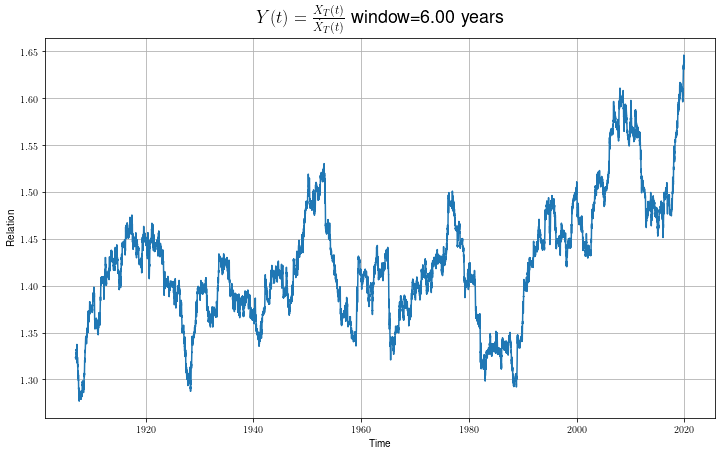

In [ ]:
plot_relation(data, 365*6)

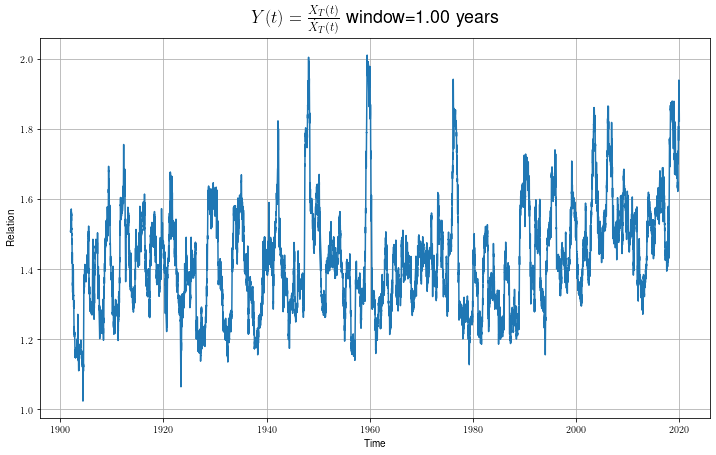

In [ ]:
plot_relation(data, 365)

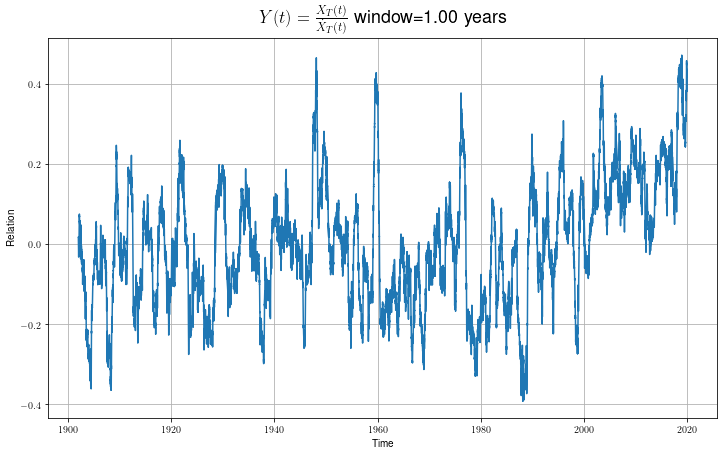

In [ ]:
plot_relation(data, 365)

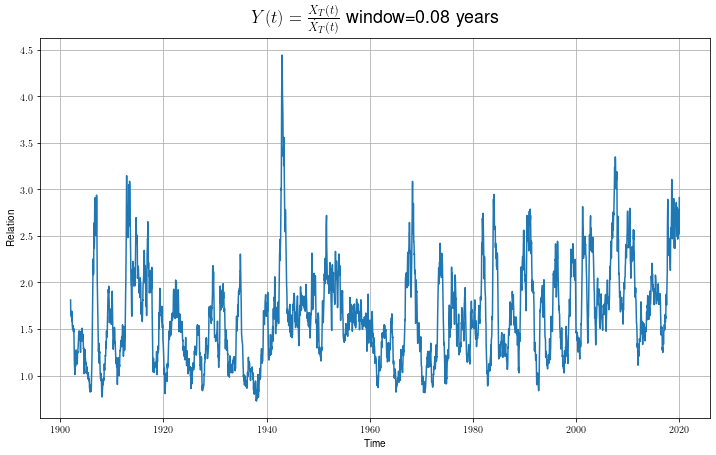

In [ ]:
df_april = data[data['month']==4]
df_april = df_april.reset_index(drop=True)
plot_relation(df_april, 30)

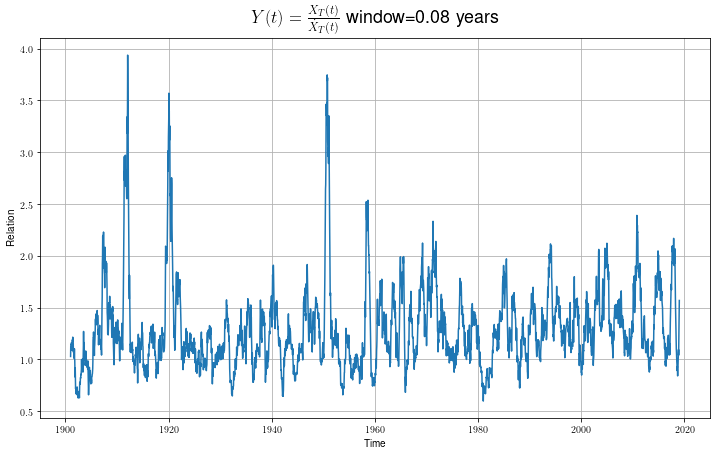

In [ ]:
df_october = data[data['month']==10]
df_october = df_october.reset_index(drop=True)
plot_relation(df_october, 30)

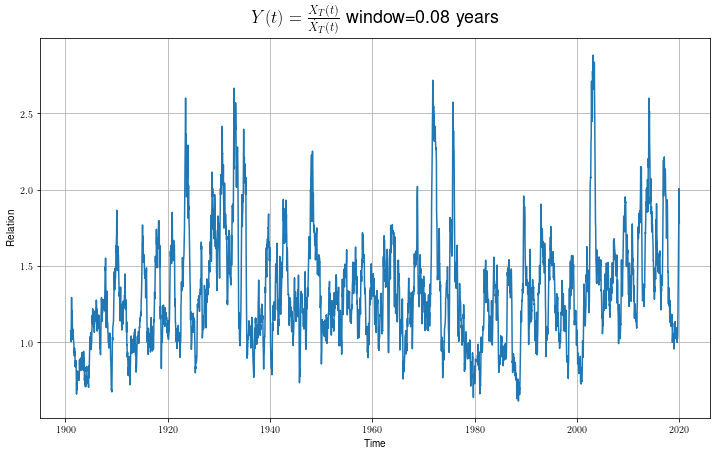

In [ ]:
df_march = data[data['month']==3]
df_march = df_march.reset_index(drop=True)
plot_relation(df_march, 30)

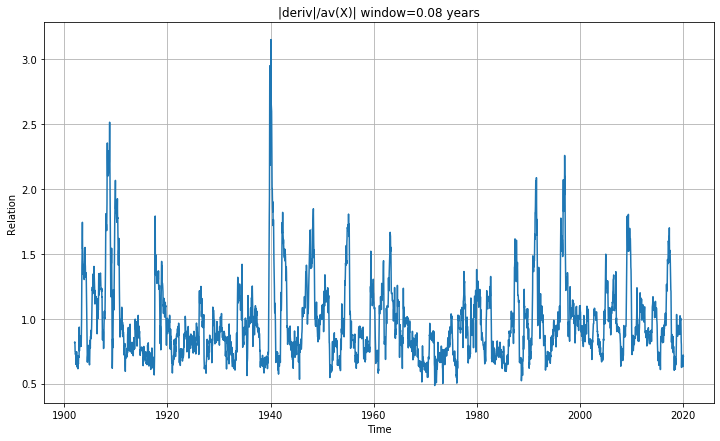

In [ ]:
df_march = data[data['month']==1]
df_march = df_march.reset_index(drop=True)
plot_relation(df_march, 30)

<a id='calc-mrc'></a>
## Считаем MRC

1. Находим среднее $M$, берем его за значение для отсечения
2. Выбираем какое-то окно длины $k$. Отображаем исходную последовательнось в бинарные последовательности длины $k$. 
$$x_i \rightarrow F(i) = I[x_i > $M$]$$
$$F_k(n) := \left[F(n), \dots , F(n + k - 1) \right]$$

[Содержание](#content)

In [8]:
SUNNY_THRESHOLD = 2

In [9]:
def get_binary_map(arr):
    _mean = SUNNY_THRESHOLD#np.mean(data['val'])
    arr = np.array(arr)
    arr -= _mean
    signs = arr >= 0
    return signs
    
def __test_get_binary_map():
    arr = [1, 2, 3, 4, 5, 6]
    bins = get_binary_map(arr)
    expected = [False, False, False, True, True, True]
    for i in range(6):
        assert bins[i] == expected[i], "invalid binary_map i=" + str(i) + " expected=" + str(expected[i]) + " actual=" + str(bins[i])
    

# we suppose that arr contains binary strings of the same
def get_entropy(arr):
    counter = {}
    for bin_str in arr:
        if bin_str in counter:
            counter[bin_str] += 1
        else:
            counter[bin_str] = 1
    entr = 0
    for k, v in counter.items():
        prob = v / len(arr)
        entr -= math.log(prob, 2) * prob
    return entr

def get_entropy2(arr):
    counter = {}
    counter1 = [0, 0]
    n = len(arr)
    for i in range(0, n - 1):
        s = (arr[i], arr[i+1])
        if s not in counter:
            counter[s] = 1
        else:
            counter[s] += 1
        counter1[int(arr[i])] += 1
    entr = 0
    for k, v in counter.items():
        prob = v / len(arr)
        entr -= math.log(prob, 2) * prob
    for v in counter1:
        prob = v / (len(arr) - 1)
        if prob > 0:
            entr += math.log(prob, 2) * prob
            
    return entr


def __test_get_entropy():
    s1 = "01"
    s2 = "10"
    s3 = "11"
    s4 = "00"
    arr = [s1, s2, s3, s3]
    entr = get_entropy(arr)
    # -1/4 ln(1/4) * 2 - 1/2 * ln(1/2) = ln 2 + 1/2 ln(2)
    
    expected = 3/2 * math.log(2, 2)
    assert eq(entr, expected), "expected=" + str(expected) + " actual=" + str(entr)
    
def __test_get_entropy2():
    s1 = "01"
    s2 = "10"
    s3 = "11"
    s4 = "00"
    arr = [s1, s2, s3, s3]
    s = "01110"
    entr = get_entropy(arr)
    # -1/4 ln(1/4) * 2 - 1/2 * ln(1/2) = ln 2 + 1/2 ln(2)
    
    expected = 3/2 * math.log(2, 2)
    assert eq(entr, expected), "expected=" + str(expected) + " actual=" + str(entr)



def test_all():
    __test_get_binary_map()
    __test_get_entropy()
    #__test_get_entropy2()
    print("all passed")


#test_all()

$E(n) = -\sum\limits_{i=1}^{2^n} p_i \log p_i$ --- энтропия бинарной строки из $n$ символов
\begin{align}
S(p, a) = E(n + 1) - E(n) = E(2) - E(1)
\end{align}
Энтропия растет линейно с увеличением длины строки.
Пусть первый символ строки равен единице с вероятностью $p$ и нулю с вероятностью $1-p$. Далее, каждый следующий символ равен предыдущему с вероятностью $a$. С вероятностью $1-a$ следующий символ будет выбран независимо от предыдущего (с вероятностью. $p$ будет 1, с $1-p$ будет 0).

Путем бумажки и ручки можно вывести, что:
\begin{align}
& S(p, 1 - a) = S(p, \varepsilon) =\\
& = p(1-p)\varepsilon \left( 2\log \varepsilon + \log p + \log (1-p) \right) + \\
& + p(1 - \varepsilon + p\varepsilon)\log (1 - \varepsilon + p\varepsilon) + \\
& + (1-p)(1-p\varepsilon)\log(1 - p\varepsilon)
\end{align}

\begin{align}
&
\end{align}

In [10]:
def get_slope_entropy(p, k=100):
    eps = np.linspace(0.01, 1, k)
    slope = []
    for e in eps:
        s = p * (1 - p) * e * (2 * math.log(e, 2) + math.log(p, 2) + math.log(1-p, 2))
        s += p * (1 - e + p * e) * math.log(1 - e + p * e, 2)
        s += (1 - p) * (1 - p * e) * math.log(1 - p * e, 2)
        slope.append(-s)
    return eps, slope

def plot_slope_entropy(ps):
    plt.figure(figsize=(12,7))
    plt.grid(True)
    plt.title("Entropy Slope")
    plt.xscale('log')
    plt.yscale('log')
    plt.ylabel("Entropy of the map " + r'$B(n) \rightarrow B(n+1)$')
    plt.xlabel(r'$\varepsilon = 1 - \alpha$' + " correlation param", fontsize=16)

    for p in ps:        
        eps, slope = get_slope_entropy(p)
        plt.plot(eps, slope, label=str(p))
        a, b = np.polyfit(np.log(eps), np.log(slope), 1)
        print('Coeff: ', a, b)
    
    plt.legend(list(map(lambda p: str(int(p * 1000) / 1000), ps)))

In [11]:
GLOBAL_REFER_EPS = []
GLOBAL_REFER_ENTROPY = []
GLOBAL_REFER_P = np.linspace(0.01, 1, 1000, endpoint=False)
for p in GLOBAL_REFER_P:
    _eps, _entr = get_slope_entropy(p)
    GLOBAL_REFER_EPS.append(_eps)
    GLOBAL_REFER_ENTROPY.append(_entr)

Coeff:  0.7563124339590191 -2.408996686197102
Coeff:  0.6743524129479654 -0.5496179373425902
Coeff:  0.6485154031305967 -0.14460388186287865
Coeff:  0.6349114631623908 0.047262707120172456
Coeff:  0.6279765435208038 0.14024843053207448
Coeff:  0.6259587589371576 0.16673698382463162
Coeff:  0.6284380649110787 0.13415466985732943
Coeff:  0.6359356625355592 0.03326558521677922
Coeff:  0.6504089229932065 -0.17238175818086154
Coeff:  0.6782357331496588 -0.6158529550678354


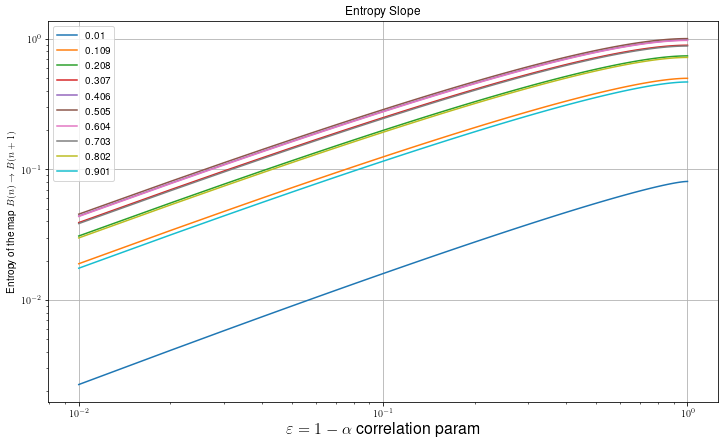

In [9]:
plot_slope_entropy(np.linspace(0.01, 1, 10, endpoint=False))

In [12]:
def get_exper_entropy(arr, window):
    n = len(arr)
    res = []
    for i in range(window - 1, n):
        arr_ = get_binary_map(arr[i-window+1:i+1])
        e = get_entropy2(arr_)
        res.append(e)
    return res

def plot_exper_entropy(df, window):
    entropy = get_exper_entropy(df['val'].tolist(), window)
    plt.figure(figsize=(12,7))
    plt.grid(True)
    plt.title('Experimental entropy, window=' + str(window))
    plt.ylabel('Entropy')
    plt.xlabel('time')
    n = len(entropy)
    years = np.linspace(df.loc[window-1, 'year'], df.loc[n-1, 'year'], n)
    plt.plot(years, entropy)
    


[6.3, 8.0, 0.0, 3.1, 1.2, 1.6, 0.1, 7.8, 6.6, 5.6, 0.5, 3.8, 7.3, 1.2, 3.9, 1.6, 2.1, 9.9, 7.1, 11.0, 11.8, 12.1, 11.9, 8.7, 12.3, 8.8, 5.9, 0.8, 8.0, 6.1]
[8.0, 0.0, 3.1, 1.2, 1.6, 0.1, 7.8, 6.6, 5.6, 0.5, 3.8, 7.3, 1.2, 3.9, 1.6, 2.1, 9.9, 7.1, 11.0, 11.8, 12.1, 11.9, 8.7, 12.3, 8.8, 5.9, 0.8, 8.0, 6.1, 0.0]
[0.0, 3.1, 1.2, 1.6, 0.1, 7.8, 6.6, 5.6, 0.5, 3.8, 7.3, 1.2, 3.9, 1.6, 2.1, 9.9, 7.1, 11.0, 11.8, 12.1, 11.9, 8.7, 12.3, 8.8, 5.9, 0.8, 8.0, 6.1, 0.0, 9.8]
[3.1, 1.2, 1.6, 0.1, 7.8, 6.6, 5.6, 0.5, 3.8, 7.3, 1.2, 3.9, 1.6, 2.1, 9.9, 7.1, 11.0, 11.8, 12.1, 11.9, 8.7, 12.3, 8.8, 5.9, 0.8, 8.0, 6.1, 0.0, 9.8, 0.0]
[1.2, 1.6, 0.1, 7.8, 6.6, 5.6, 0.5, 3.8, 7.3, 1.2, 3.9, 1.6, 2.1, 9.9, 7.1, 11.0, 11.8, 12.1, 11.9, 8.7, 12.3, 8.8, 5.9, 0.8, 8.0, 6.1, 0.0, 9.8, 0.0, 3.9]
[1.6, 0.1, 7.8, 6.6, 5.6, 0.5, 3.8, 7.3, 1.2, 3.9, 1.6, 2.1, 9.9, 7.1, 11.0, 11.8, 12.1, 11.9, 8.7, 12.3, 8.8, 5.9, 0.8, 8.0, 6.1, 0.0, 9.8, 0.0, 3.9, 2.9]
[0.1, 7.8, 6.6, 5.6, 0.5, 3.8, 7.3, 1.2, 3.9, 1.6, 2.1, 9.9, 7.1

[0.0, 0.6, 6.0, 10.2, 0.4, 6.9, 6.0, 0.0, 0.0, 5.8, 8.4, 7.9, 6.0, 0.0, 0.0, 6.4, 11.4, 11.2, 11.7, 11.5, 7.4, 11.2, 11.5, 9.4, 11.8, 12.4, 1.1, 4.1, 12.6, 0.0]
[0.6, 6.0, 10.2, 0.4, 6.9, 6.0, 0.0, 0.0, 5.8, 8.4, 7.9, 6.0, 0.0, 0.0, 6.4, 11.4, 11.2, 11.7, 11.5, 7.4, 11.2, 11.5, 9.4, 11.8, 12.4, 1.1, 4.1, 12.6, 0.0, 3.7]
[6.0, 10.2, 0.4, 6.9, 6.0, 0.0, 0.0, 5.8, 8.4, 7.9, 6.0, 0.0, 0.0, 6.4, 11.4, 11.2, 11.7, 11.5, 7.4, 11.2, 11.5, 9.4, 11.8, 12.4, 1.1, 4.1, 12.6, 0.0, 3.7, 6.8]
[10.2, 0.4, 6.9, 6.0, 0.0, 0.0, 5.8, 8.4, 7.9, 6.0, 0.0, 0.0, 6.4, 11.4, 11.2, 11.7, 11.5, 7.4, 11.2, 11.5, 9.4, 11.8, 12.4, 1.1, 4.1, 12.6, 0.0, 3.7, 6.8, 1.5]
[0.4, 6.9, 6.0, 0.0, 0.0, 5.8, 8.4, 7.9, 6.0, 0.0, 0.0, 6.4, 11.4, 11.2, 11.7, 11.5, 7.4, 11.2, 11.5, 9.4, 11.8, 12.4, 1.1, 4.1, 12.6, 0.0, 3.7, 6.8, 1.5, 4.8]
[6.9, 6.0, 0.0, 0.0, 5.8, 8.4, 7.9, 6.0, 0.0, 0.0, 6.4, 11.4, 11.2, 11.7, 11.5, 7.4, 11.2, 11.5, 9.4, 11.8, 12.4, 1.1, 4.1, 12.6, 0.0, 3.7, 6.8, 1.5, 4.8, 3.9]
[6.0, 0.0, 0.0, 5.8, 8.4, 7.9, 6.0, 

[5.3, 5.7, 0.2, 11.5, 10.9, 2.0, 1.0, 0.0, 1.0, 3.4, 0.1, 0.2, 0.0, 8.4, 3.7, 5.6, 5.7, 5.5, 7.4, 4.9, 6.0, 4.1, 7.2, 7.2, 4.0, 10.1, 2.8, 11.4, 10.7, 12.8]
[5.7, 0.2, 11.5, 10.9, 2.0, 1.0, 0.0, 1.0, 3.4, 0.1, 0.2, 0.0, 8.4, 3.7, 5.6, 5.7, 5.5, 7.4, 4.9, 6.0, 4.1, 7.2, 7.2, 4.0, 10.1, 2.8, 11.4, 10.7, 12.8, 11.8]
[0.2, 11.5, 10.9, 2.0, 1.0, 0.0, 1.0, 3.4, 0.1, 0.2, 0.0, 8.4, 3.7, 5.6, 5.7, 5.5, 7.4, 4.9, 6.0, 4.1, 7.2, 7.2, 4.0, 10.1, 2.8, 11.4, 10.7, 12.8, 11.8, 10.5]
[11.5, 10.9, 2.0, 1.0, 0.0, 1.0, 3.4, 0.1, 0.2, 0.0, 8.4, 3.7, 5.6, 5.7, 5.5, 7.4, 4.9, 6.0, 4.1, 7.2, 7.2, 4.0, 10.1, 2.8, 11.4, 10.7, 12.8, 11.8, 10.5, 13.8]
[10.9, 2.0, 1.0, 0.0, 1.0, 3.4, 0.1, 0.2, 0.0, 8.4, 3.7, 5.6, 5.7, 5.5, 7.4, 4.9, 6.0, 4.1, 7.2, 7.2, 4.0, 10.1, 2.8, 11.4, 10.7, 12.8, 11.8, 10.5, 13.8, 0.6]
[2.0, 1.0, 0.0, 1.0, 3.4, 0.1, 0.2, 0.0, 8.4, 3.7, 5.6, 5.7, 5.5, 7.4, 4.9, 6.0, 4.1, 7.2, 7.2, 4.0, 10.1, 2.8, 11.4, 10.7, 12.8, 11.8, 10.5, 13.8, 0.6, 3.6]
[1.0, 0.0, 1.0, 3.4, 0.1, 0.2, 0.0, 8.4, 3.7, 5.6

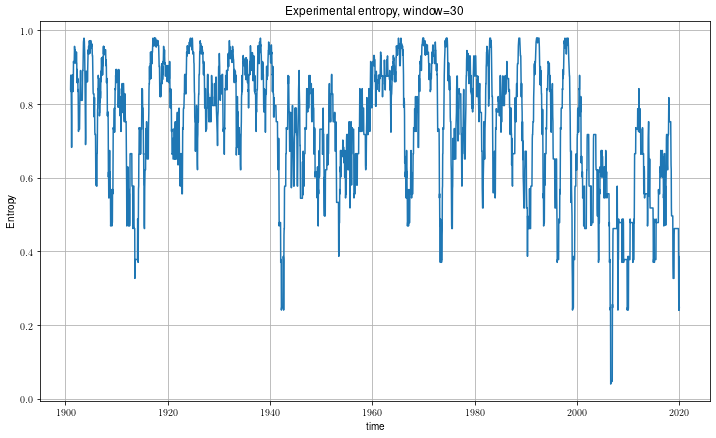

In [13]:
df = data[data['month']==4]
df = df.reset_index(drop=True)
plot_exper_entropy(df, 30)

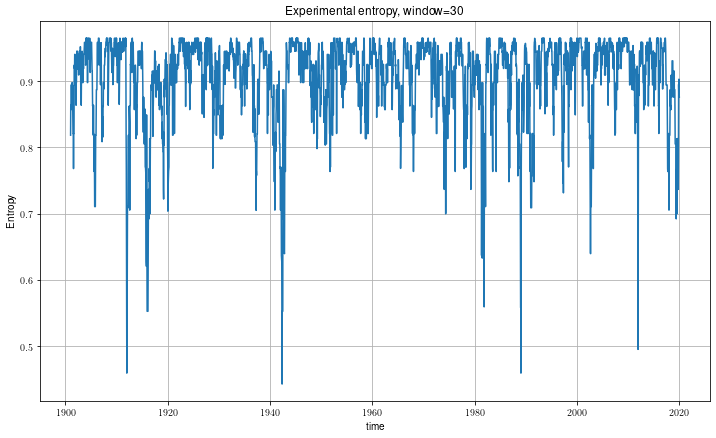

In [ ]:
df = data[data['month']==4]
df = df.reset_index(drop=True)
plot_exper_entropy(df, 30)

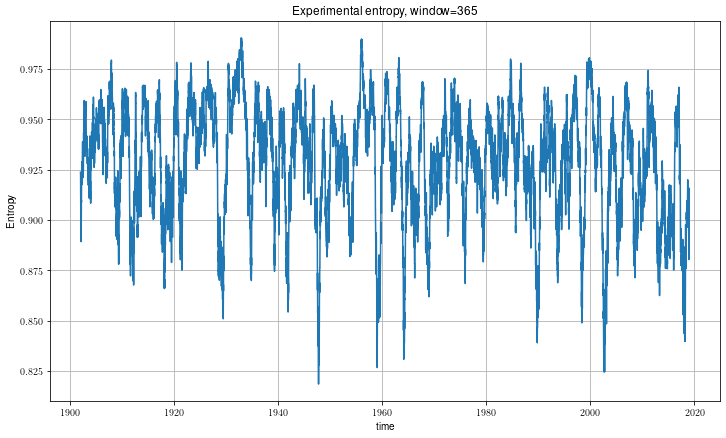

In [17]:
SUNNY_THRESHOLD = 3
plot_exper_entropy(data, 365)

In [3]:
from collections import defaultdict

def find_eps(entropy_exp):
    ans = 0
    i = 0
    for _eps, _entr in zip(GLOBAL_REFER_EPS, GLOBAL_REFER_ENTROPY):
        idx = bisect.bisect(_entr, entropy_exp)
        n = len(_eps)
        if idx != n:
            ans += math.log(_eps[idx])
            i += 1
    ans /= i
    ans = math.exp(ans)
    return ans

def find_eps2(entropy_exp):
    ans = 0
    i = 0
    cnt = 0
    for _eps, _entr in zip(GLOBAL_REFER_EPS, GLOBAL_REFER_ENTROPY):
        idx = bisect.bisect(_entr, entropy_exp)
        n = len(_eps)
        if idx != n:
            #print('p = {}'.format(GLOBAL_REFER_P[i]))
            ans += math.log(_eps[min(n - 1, idx)])
            cnt += 1
        i += 1
    ans /= cnt
    ans = math.exp(ans)
    return ans

def find_lifetime(entropy_exp):
    eps = find_eps(entropy_exp)
    return 1/eps

def get_lifetimes(df, window):
    arr = df['val'].tolist()
    entropys = get_exper_entropy(arr, window)
    lf = []
    for entr in entropys:
        lf.append(find_lifetime(entr))
    return lf

def get_lifetimes2(df, window):
    arr = df['val'].tolist()
    entropys = get_exper_entropy(arr, window)
    lf = []
    for entr in entropys:
        eps = find_eps2(entr)
        lf.append(1/eps)
    return lf

def plot_lifetimes(df, window):
    lifetimes = get_lifetimes(df, window)
    dates = df.loc[window-1:, 'year'].tolist()
    dates = np.linspace(dates[0], dates[-1], len(dates))
    plt.figure(figsize=(12, 7))
    plt.title('Lifetime, window=' + str(window))
    plt.xlabel('Date')
    plt.ylabel('Lifetime')
    plt.grid(True)
    plt.plot(dates, lifetimes)
    
    
def plot_lifetimes2(df, window):
    lifetimes = get_lifetimes2(df, window)
    dates = df.loc[window-1:, 'year'].tolist()
    dates = np.linspace(dates[0], dates[-1], len(dates))
    plt.figure(figsize=(12, 7))
    plt.title('Lifetime, window=' + str(window))
    plt.xlabel('Date')
    plt.ylabel('Lifetime')
    plt.grid(True)
    plt.plot(dates, lifetimes)
    
def plot_all(df, window, corr_window=365, plot_entropy=True):
    fig, (ax1, ax2) = plt.subplots(2, 1)
    fig.set_figwidth(14)
    fig.set_figheight(10)
    ax1.grid(True)
    ax2.grid(True)
    ax1.set_title('Lifetimes: both methods')
    ax1.set_xlabel('Date', fontsize=14)
    ax1.set_ylabel('Lifetime', fontsize=14)
    lifetimes = get_lifetimes(df, window)
    relation = build_relation(df, window)
    dates = df.loc[window-1:, 'year'].tolist()
    dates = np.linspace(dates[0], dates[-1], len(dates))
    n = df.shape[0]
    years = np.linspace(df.loc[window - 1, 'year'], df.loc[n - 1, 'year'], n - window)
    ax1.plot(years, relation[window:], label='By derivative')
    if plot_entropy:
        ax1.plot(dates, lifetimes, label='By entropy')
        s1 = pd.Series(relation[window:])
        s2 = pd.Series(lifetimes)
        corr = s1.rolling(corr_window).corr(s2)
        ax2.plot(years[corr_window - 1:], corr[corr_window : ], label='corrcoeff', color='tab:red')        
    else:
        ax2.plot(years, pd.Series(relation[window:]).rolling(corr_window).mean(), label='mean in window {}'.format(corr_window))
    ax1.legend(fontsize=14)
    ax2.legend(fontsize=14)
    
def plot_all3(df, window, corr_window=365, predicate=lambda x: True):
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1)
    fig.set_figwidth(14)
    fig.set_figheight(10)
    ax1.grid(True)
    ax2.grid(True)
    ax1.set_title('Lifetimes: both methods')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Lifetime')
    mask = df['month'].apply(predicate)
    lifetimes = np.array(get_lifetimes(df, window)[1:])
    mask = np.array(mask[window:])
    lifetimes = lifetimes[mask]
    relation = build_relation(df, window)[window:]
    dates = df.loc[window:, 'year'].tolist()
    relation = relation[mask]
    dates = np.linspace(dates[0], dates[-1], len(lifetimes))
    n = df.shape[0]
    years = np.linspace(df.loc[window - 1, 'year'], df.loc[n - 1, 'year'], len(relation))
    ax1.plot(years, relation, label='By derivative')
    ax1.plot(dates, lifetimes, label='By entropy')
    s1 = pd.Series(relation)
    s1_smooth = s1.rolling(365).mean()
    s2 = pd.Series(lifetimes)
    s2_smooth = s2.rolling(365).mean()
    corr = s1_smooth.rolling(corr_window).corr(s2_smooth)
    ax3.plot(years[:s1_smooth.size], s1_smooth, label='By derivative')
    ax3.plot(dates[:s2_smooth.size], s2_smooth, label='By entropy')
    ax2.plot(years[365 + corr_window:], corr[365+ corr_window : ], label='corrcoeff', color='tab:red')
    ax1.legend()
    ax2.legend()
    ax3.legend()
    
def plot_all_means(df, window):
    mean_window = 365
    lifetimes = get_lifetimes(df, window)
    m = len(lifetimes)
    lifetimes_means = np.zeros(m)
    for i in range(mean_window, m):
        lifetimes_means[i] = np.mean(lifetimes[i - mean_window : i + 1])

    relation = build_relation(df, window)
    m = len(relation)
    relation_means = np.zeros(m)
    for i in range(mean_window, m):
        relation_means[i] = np.mean(relation[i - mean_window : i + 1])
    plt.figure(figsize=(14, 10))
    plt.grid(True)
    plt.title('Lifetimes: both methods')
    plt.xlabel('Date')
    plt.ylabel('Lifetime')
    dates = df.loc[window-1:, 'year'].tolist()
    dates = np.linspace(dates[0], dates[-1], len(dates))
    n = df.shape[0]
    years = np.linspace(df.loc[window - 1, 'year'], df.loc[n - 1, 'year'], n - window)
    plt.plot(years, relation_means[window:], label='By derivative')
    plt.plot(dates, lifetimes_means, label='By entropy')
    plt.legend()
    
    
def plot_all_resize(df, window, scale):
    lifetimes = get_lifetimes(df, window)
    relation = build_relation(df, window)
    plt.figure(figsize=(14, 7))
    plt.grid(True)
    plt.title('Lifetimes: both methods')
    plt.xlabel('Date')
    plt.ylabel('Lifetime')
    dates = df.loc[window-1:, 'year'].tolist()
    dates = np.linspace(dates[0], dates[-1], len(dates))
    n = df.shape[0]
    years = np.linspace(df.loc[window - 1, 'year'], df.loc[n - 1, 'year'], n - window)
    rescaled = np.array(relation[window:])
    rescaled /= scale
    plt.plot(years, rescaled, label='By derivative')
    plt.plot(dates, lifetimes, label='By entropy')
    plt.legend()
    
    
def plot_all2(df,  window):
    lifetimes = get_lifetimes(df, window)[1:]
    relation = build_relation(df, window)
    relation = relation[window:]
    polynom = np.polyfit(lifetimes, relation, 1)
    domain = np.linspace(1, 1.5, 100)
    values = list(map(lambda x : x * polynom[0] + polynom[1], domain))
    plt.figure(figsize=(14,7))
    plt.xlabel('By entropy')
    plt.ylabel('By derivatives')
    plt.scatter(lifetimes, relation)
    plt.plot(domain, values, c='magenta')
    
def get_entropy_from_counters(counter_1, counter_2, window_size):
    entr = 0
    for k, v in counter_2.items():
        prob = v * 1.0 / (window_size - 1)
        if prob > 0:
            entr -= math.log(prob, 2) * prob
    for k, v in counter_1.items():
        prob = v * 1.0 / window_size
        if prob > 0:
            entr += math.log(prob, 2) * prob
    return entr
    
def get_lifetime_by_predicate(df, threshold, predicate, predicate_name="Predicate", smooth_window=5):
    years = []
    lifetimes = []
    n = df.shape[0]
    count_ones = defaultdict(int)
    count_twos = defaultdict(int)
    is_first = True
    bin_map = ['1' if x else '0' for x in df['val'] >= threshold]
    sz = 0
    for i in range(n):
        if not predicate(df.loc[i, 'month']):
            is_first = True
            if sz != 0:
                exper_entropy = get_entropy_from_counters(count_ones, count_twos, sz)
                lt = 1/find_eps2(exper_entropy)
                lifetimes.append(lt)
                years.append(df.loc[i, 'year'])
                count_ones = defaultdict(int)
                count_twos = defaultdict(int)
            sz = 0
        else:
            count_ones[bin_map[i]] += 1
            if not is_first:
                count_twos[bin_map[i - 1] + bin_map[i]] += 1
            is_first = False
            sz += 1
    fig, axes = plt.subplots(2, figsize=(15, 12))
    
    axes[0].set_title('Lifetimes : {}, threshold: {}'.format(predicate_name, threshold), fontsize=18)
    axes[0].plot(years, lifetimes, label='lifetimes')
    axes[0].legend(fontsize=14)
    axes[0].grid(True)
    lt_means = pd.Series(lifetimes).rolling(smooth_window).mean()
    year_means = years[-lt_means.size:]
    axes[1].set_title('Rolling mean. Window = {} years'.format(smooth_window), fontsize=18)
    axes[1].plot(year_means, lt_means, label='smoothed lifetimes')
    axes[1].legend(fontsize=14)
    axes[1].grid(True)
            
#plot_all(data, 365)
#plot_all2(data, 365)

Посмотрим на то, как меняется lifetime в разные сезоны в зависимости от порога.


| Threshold |  Summer | Autumn | Winter | Spring |
| --- | --- | --- | --- | --- |
| 1   |  None  | Up  |  Down   |  Up   |
| 2   |  Up    | Up  | Down    |  Up   |
| 3   |  Up    | const |  Down   | Up    |
| 4   |  Up    | Down  | Down    | Up    |
| 5   |  Up    | Down  |  Down   |  const   |
| 6   |  Down  | Down  |  None   | Down    |
| 7   |  Down  |  ?  |  None   |  Down   |
| 8   |  Down  |  ?   | None    |  Down   |
| 9   |  Down  |  None  |   None  |  Down   |


In [4]:
data[data['month']==12][data['day']==21].mean()

NameError: name 'data' is not defined

In [2]:
get_lifetime_by_predicate(data, 2, lambda month: (month < 12) & (month > 8), "Autumn")

NameError: name 'get_lifetime_by_predicate' is not defined

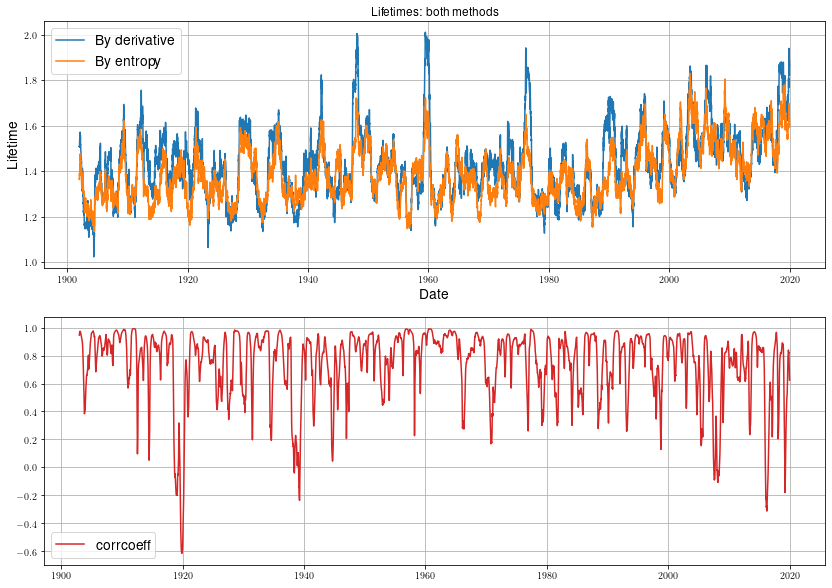

In [11]:
SUNNY_THRESHOLD = 2
plot_all(data, window=365)

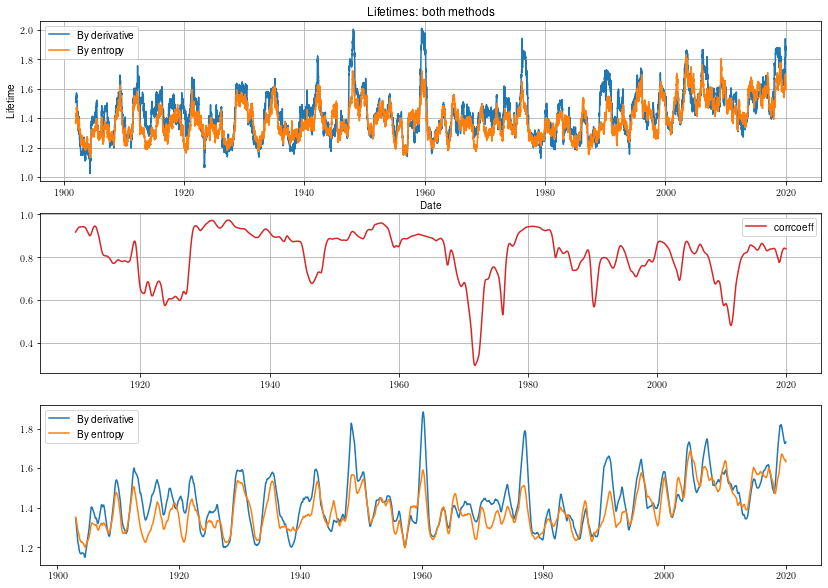

In [33]:
plot_all3(data, window=365, corr_window=7*365)

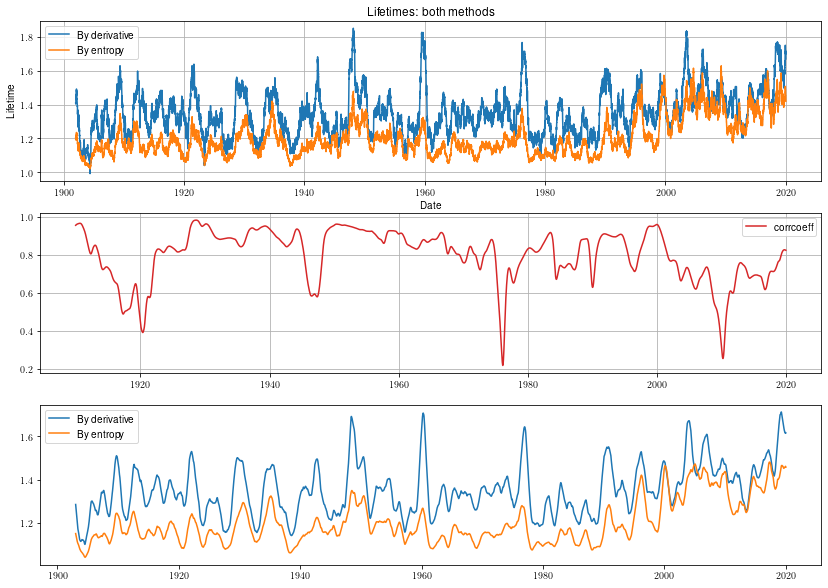

In [ ]:
plot_all3(data_rel, window=365, corr_window=7*365)

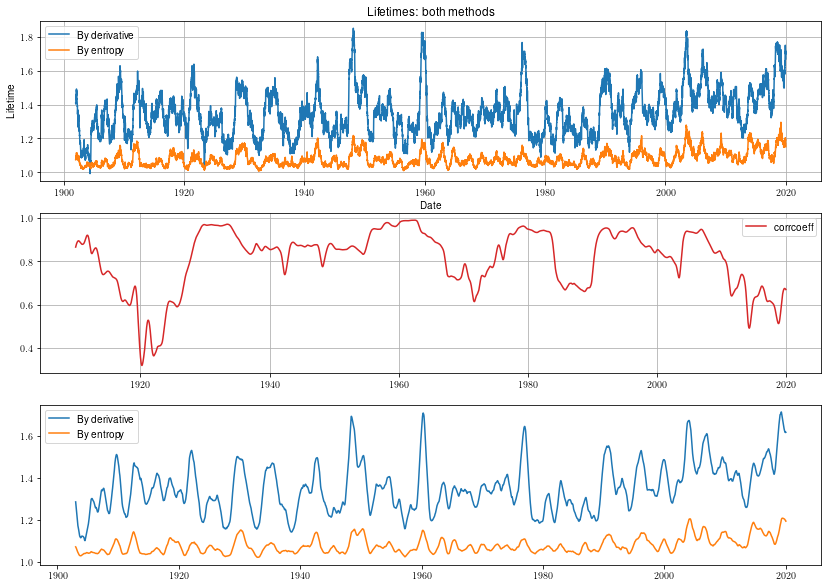

In [ ]:
SUNNY_THRESHOLD = 0.2
plot_all3(data_rel, window=365, corr_window=7*365)

In [ ]:
SUNNY_THRESHOLD = 0.2
plot_all3(data_rel, window=365, corr_window=7*365)

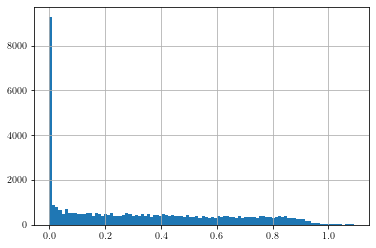

In [ ]:
data_rel['val'].hist(bins=100)

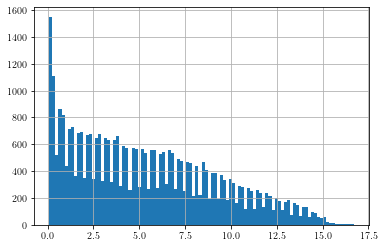

In [ ]:
data.loc[data['val'] != 0]['val'].hist(bins=100)

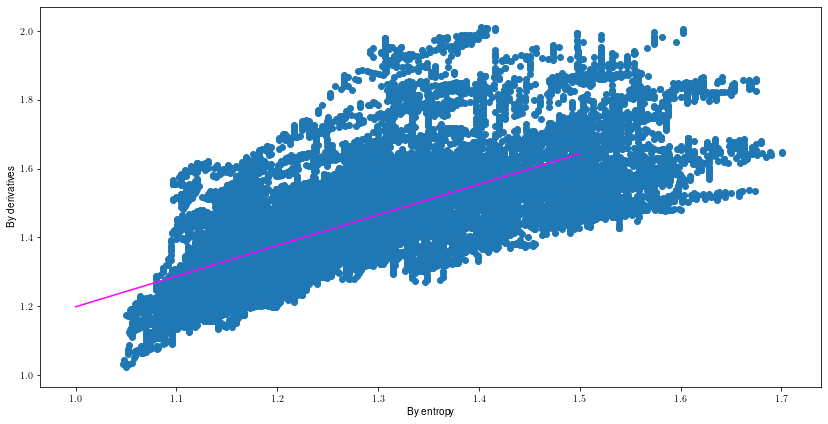

In [ ]:
# threshold = 1
plot_all2(data, 365)

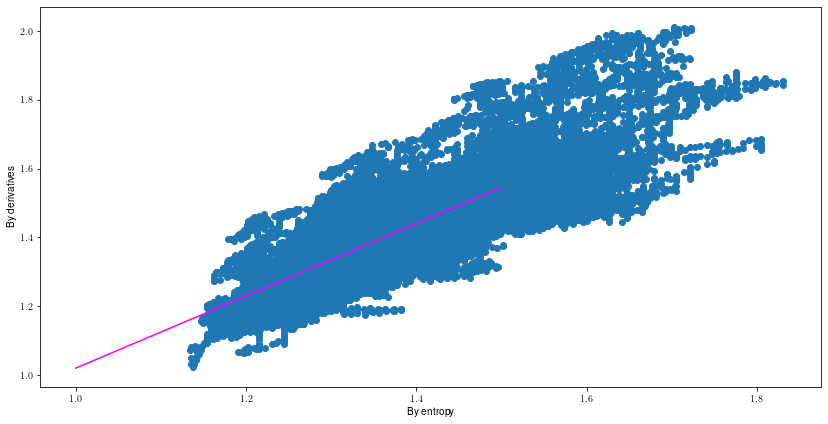

In [35]:
plot_all2(data, 365)

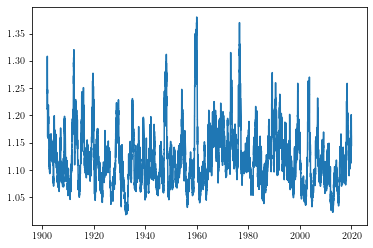

In [ ]:
window = 365
dates = data.loc[window-1:, 'year'].tolist()
exp_entropys = get_exper_entropy(data['val'].tolist(), window)
dates = np.linspace(dates[0], dates[-1], len(exp_entropys))
epss = list(map(find_eps, exp_entropys))
lifetimes = list(map(lambda x : 1/x, epss))

plt.plot(dates, lifetimes)

Как можно выделить отдельные отрезки:
* Заменить все вне этих отрезков константой
* Заменить все вне этих отрезков сглаженными значениями (взять дней 10, например).
* Взять машинное обучение, натренировать модель на создание дней на основе только выбранного периода года. После чего нагенерить серию с помощью модели и прогнать стандартный алгоритм. Или можно просто посмотреть на коэффиценты в модели, если будет получаться прямая зависимость от предыдущих дней


In [14]:
# retrieves the period
def get_period(df, time_filter):
    df_copy = df.copy(deep=True)
    mean_ = np.mean(df_copy[time_filter(df_copy['month']) == False]['val'])
    print(mean_)
    df_copy.loc[time_filter(df['month']) == False, 'val'] = mean_
    return df_copy

def get_autumns(df):
    return get_period(df, lambda x : (8 < x) & (x < 12))

def get_summers(df):
    return get_period(df, lambda x : (5 < x) & (x < 9))

def get_winters(df):
    return get_period(df, lambda x : (x == 12) | ((0 < x) & (x < 3)))

def get_springs(df):
    return get_period(df, lambda x : (2 < x) & (x < 6))

def get_februaries(df):
    return get_period(df, lambda x : x == 2)

def get_marchs(df):
    return get_period(df, lambda x : x == 3)

def get_aprils(df):
    return get_period(df, lambda x : x == 4)

def get_mays(df):
    return get_period(df, lambda x : x == 5)

def get_junes(df):
    return get_period(df, lambda x : x == 6)

def get_julys(df):
    return get_period(df, lambda x : x == 7)

def get_augusts(df):
    return get_period(df, lambda x : x == 8)

def get_aprils(df):
    return get_period(df, lambda x : x == 9)

def get_octobers(df):
    return get_period(df, lambda x : x == 10)

def get_novembers(df):
    return get_period(df, lambda x : x == 11)

def get_decembers(df):
    return get_period(df, lambda x : x == 12)



<a id="method2"></a>
## Способ 2 : сглаживание
![method2_schema.jpg](attachment:method2_schema.jpg)
Интересный нам фрагмент оставляем без изменений. Все остальные значения заменяем средним в окне размером в $10$ дней (число взято пока что наугад). В предыдущем методе в качестве порогового значения в подсчете энтропии бралось глобальное среднее. Тут же возьмем в качестве порога $2$. ([изменить значения порога](#calc-mrc))

[Содержание](#content)

In [15]:
def get_smoothed(df, time_filter, window=5):
    df_copy = df.copy(deep=True)
    n = df_copy.shape[0]
    cursum = np.sum(df.loc[0: 2 * window - 1, 'val'])
    for i in range(window, n - window):
        if i % 1000 == 0:
            print('*', end='')
        cursum += df.at[i + window, 'val']
        if i > window:
            cursum -= df.at[i - window - 1, 'val']
        if not time_filter(df_copy.at[i, 'month']):
            df_copy.at[i, 'val'] = cursum / (2 * window + 1)
    print()
    return df_copy

def get_smoothed_winters(df, window=5):
    return get_smoothed(df, lambda x : x == 12 | (0 < x & x < 3), window)

def get_smoothed_springs(df, window=5):
    return get_smoothed(df, lambda x : (2 < x & x < 6), window)

def get_smoothed_summers(df, window=5):
    return get_smoothed(df, lambda x : (5 < x & x < 9), window)

def get_smoothed_autumns(df, window=5):
    return get_smoothed(df, lambda x : (8 < x & x < 12), window)

def get_smoothed_marchs(df, window=5):
    return get_smoothed(df, lambda x : (x == 3), window)

def get_smoothed_aprils(df, window=5):
    return get_smoothed(df, lambda x : (x == 4), window)

def get_smoothed_octobers(df, window=5):
    return get_smoothed(df, lambda x : (x == 10), window)






## Изменяем масштаб всего вне нужного отрезка


In [16]:
def rescale_outer(df, predicate, rescale):
    data = df.copy(deep=True)
    mask = predicate(df['month'])
    mask = np.array([1 if x else 0 for x in mask])
    new_val = np.array(df['val'])
    new_val = new_val * mask + new_val * rescale * (1 - mask)
    data['val'] = np.array(new_val)
    return data

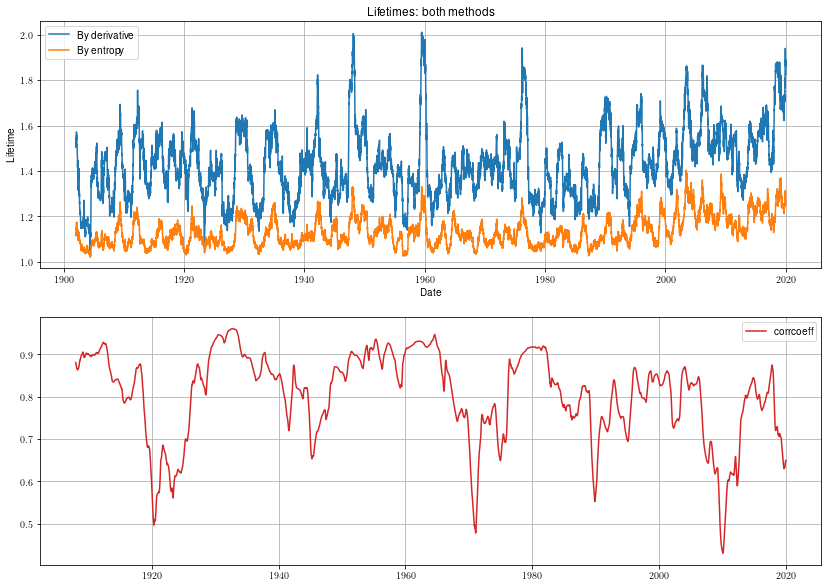

In [ ]:
plot_all(data, 365, corr_window=365*6)

## Меняем подход

Теперь попробуем сначала считать меру, а только потом фильтровать нужный диапазон.

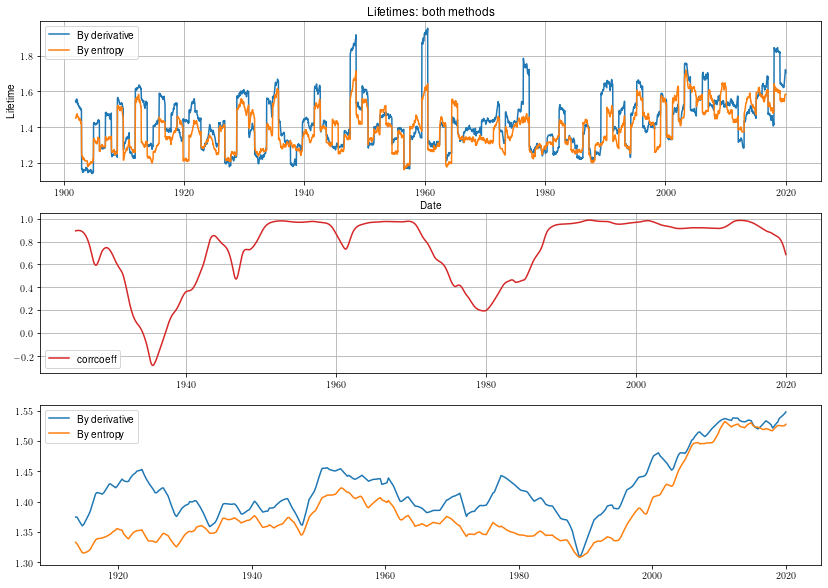

In [41]:
plot_all3(data, window=365, predicate=lambda month: month==3)

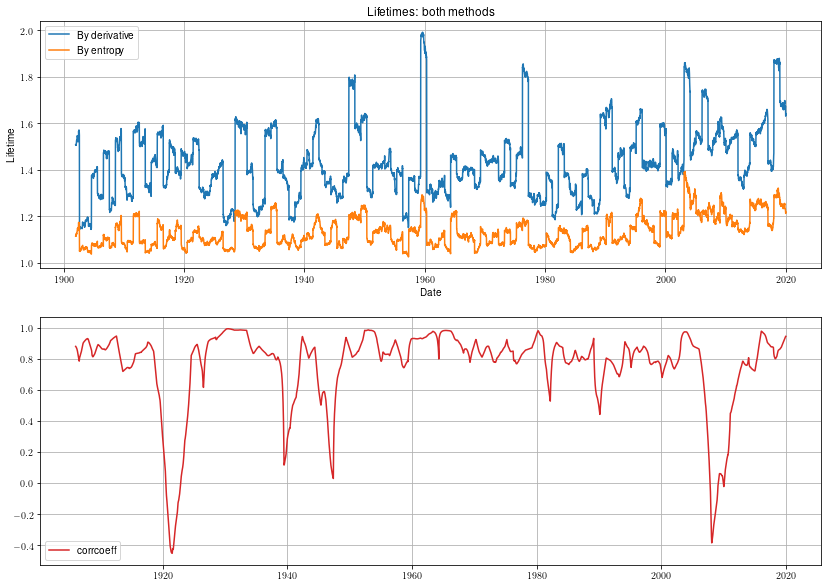

In [ ]:
plot_all3(data, window=365, predicate=lambda month: (month==1) | (month==2) | (month==12))

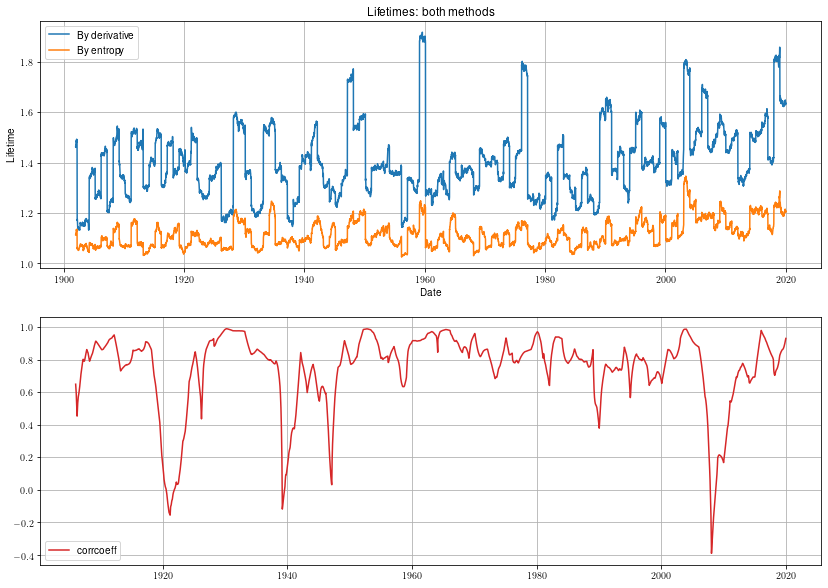

In [ ]:
plot_all3(data, window=400, predicate=lambda month: (month==1) | (month == 2) | (month == 12))

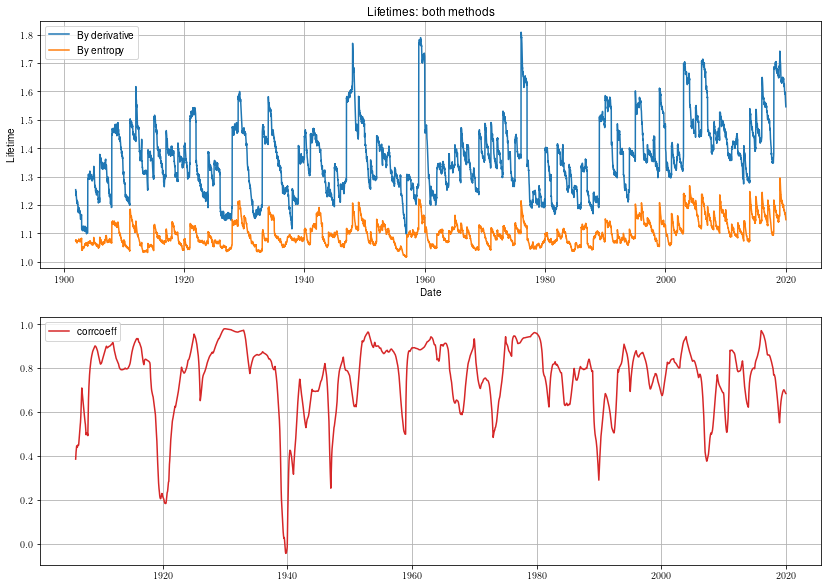

In [ ]:
plot_all3(data, window=500, predicate=lambda month: (month==1) | (month == 2) | (month == 12))

Интересные картинки про погоду:
![image.png](attachment:image.png)
https://www.ncdc.noaa.gov/cag/global/haywood/53.0,3.7/land_ocean -- источник


## Посмотрим какую-нибудь другую станцию

Взяли Eelde.dat

In [17]:
data_Eelde = pd.read_csv('data/Eelde.dat', sep='\s+')
data_Eelde.columns = ["year", "month", "day", "val"]
data_Maastricht = pd.read_csv('data/Maastricht.dat', sep='\s+')
data_Maastricht.columns = ["year", "month", "day", "val"]
data_Vlissingen = pd.read_csv('data/Vlissingen.dat', sep='\s+')
data_Vlissingen.columns = ["year", "month", "day", "val"]
data_DeKooy = pd.read_csv('data/DeKooy.dat', sep='\s+')
data_DeKooy.columns = ["year", "month", "day", "val"]

In [ ]:
data_Eelde

,year,month,day,val
0,1906,1,3,3.1
1,1906,1,4,0.0
2,1906,1,5,0.0
3,1906,1,6,0.0
4,1906,1,7,0.9
...,...,...,...,...
41809,2020,7,21,10.0
41810,2020,7,22,6.1
41811,2020,7,23,4.9
41812,2020,7,24,5.4


## Зима - декабрь, январь, февраль

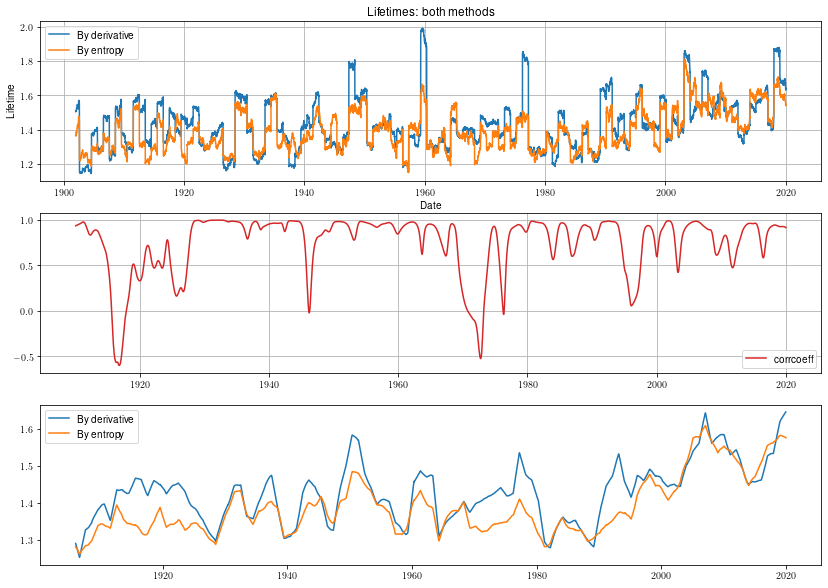

In [42]:
plot_all3(data, window=365, predicate=lambda month: (month==1) | (month==2) | (month==12))

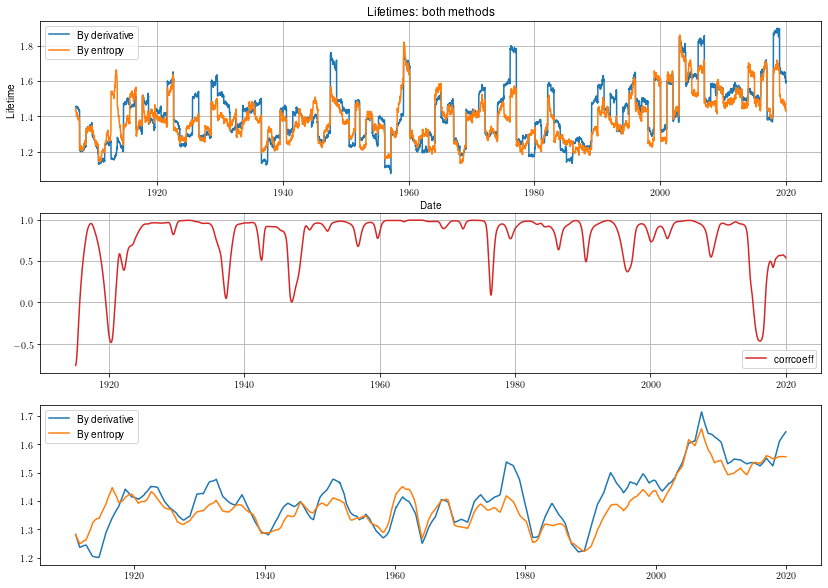

In [45]:
plot_all3(data_Eelde, window=365, predicate=lambda month: (month==1) | (month==2) | (month==12))

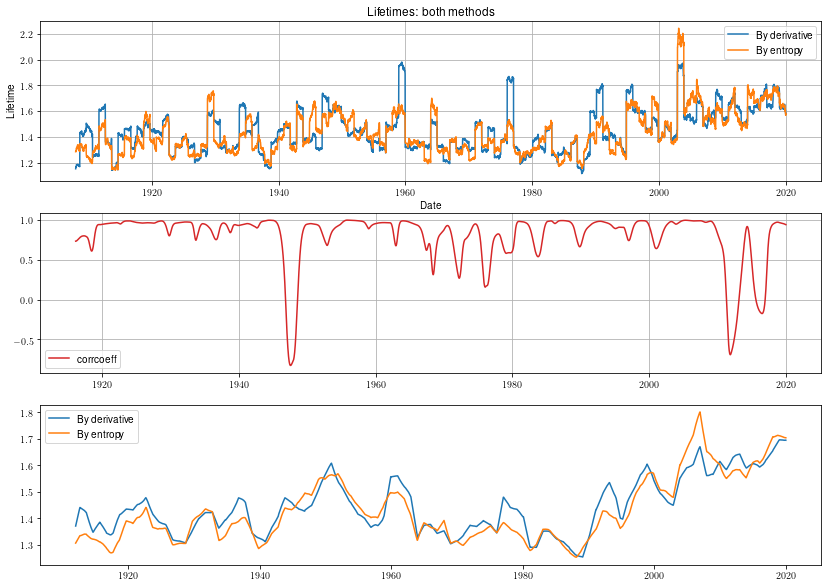

In [46]:
plot_all3(data_Vlissingen, window=365, predicate=lambda month: (month==1) | (month==2) | (month==12))

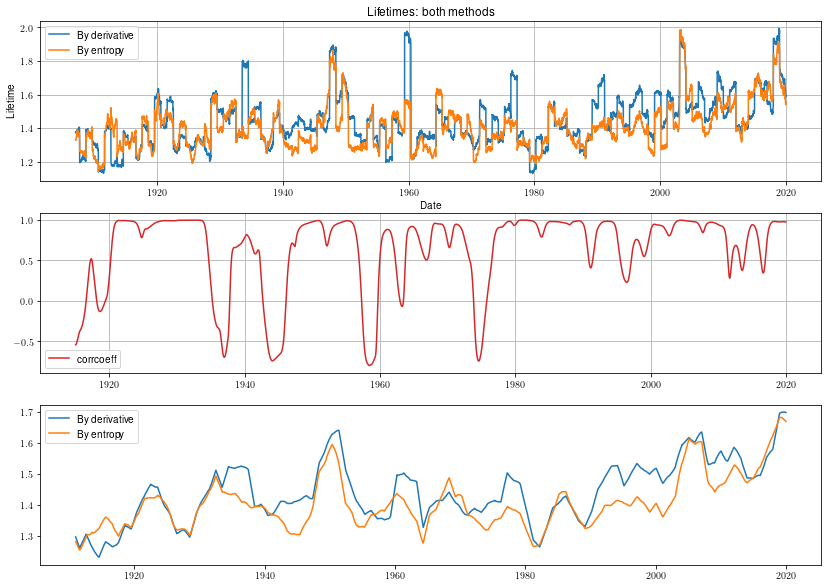

In [47]:
plot_all3(data_Maastricht, window=365, predicate=lambda month: (month==1) | (month==2) | (month==12))

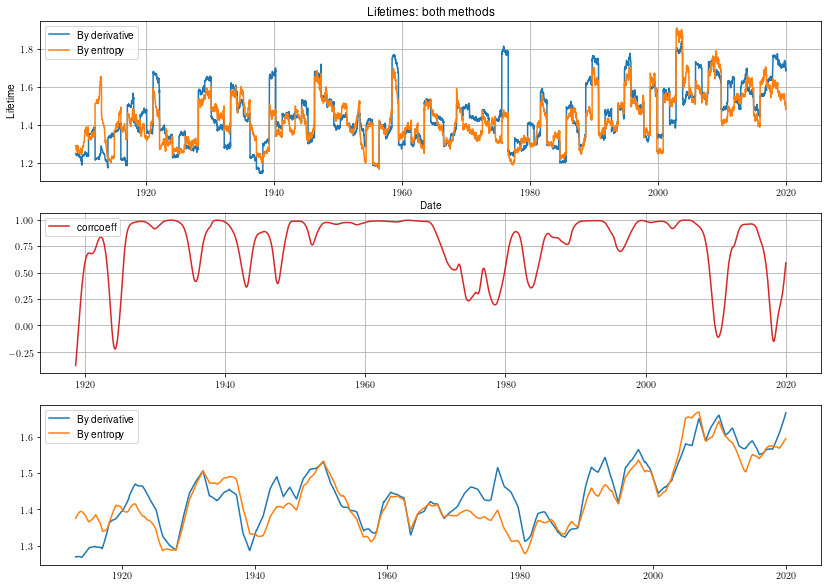

In [48]:
plot_all3(data_DeKooy, window=365, corr_window=500, predicate=lambda month: (month==1) | (month==2) | (month==12))

## Весна -- март, апрель

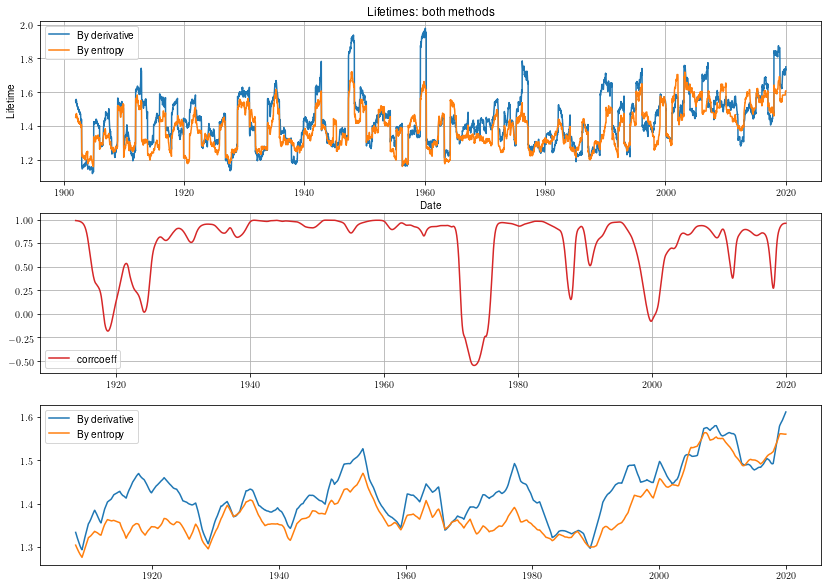

In [49]:
plot_all3(data, window=365, predicate=lambda month: (month>2) & (month<5))

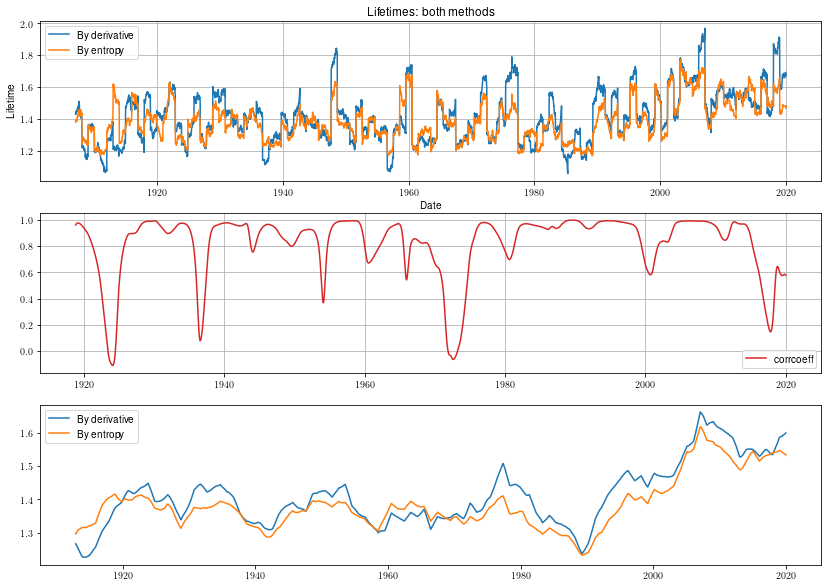

In [50]:
plot_all3(data_Eelde, window=365, predicate=lambda month: (month>2) & (month<5))

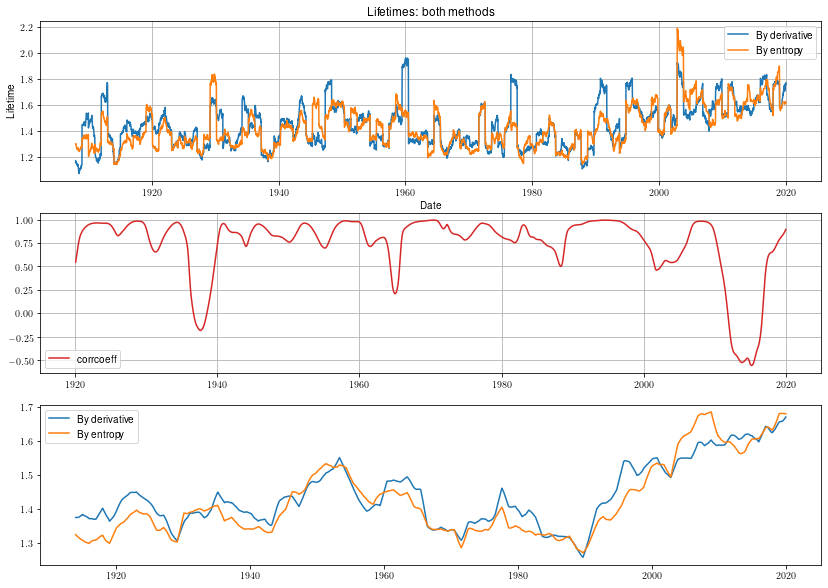

In [51]:
plot_all3(data_Vlissingen, window=365, predicate=lambda month: (month>2) & (month<5))

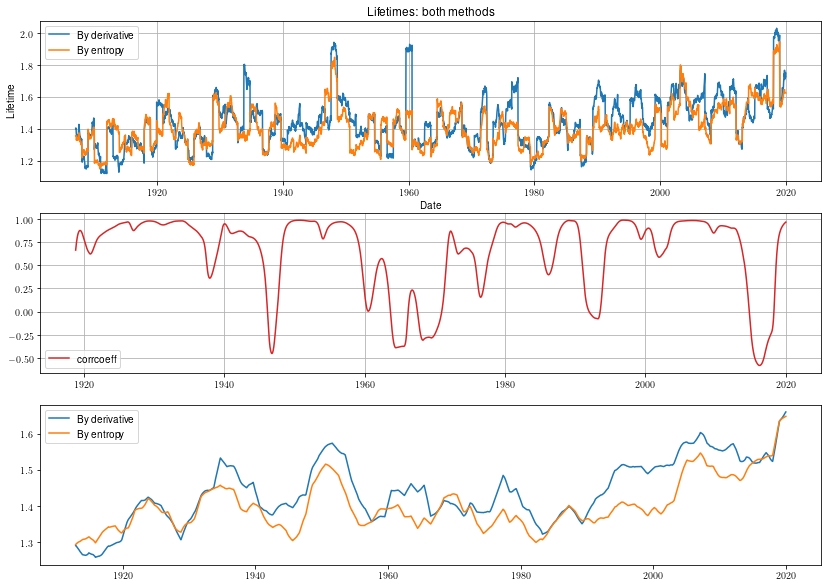

In [52]:
plot_all3(data_Maastricht, window=365, predicate=lambda month: (month>2) & (month<5))

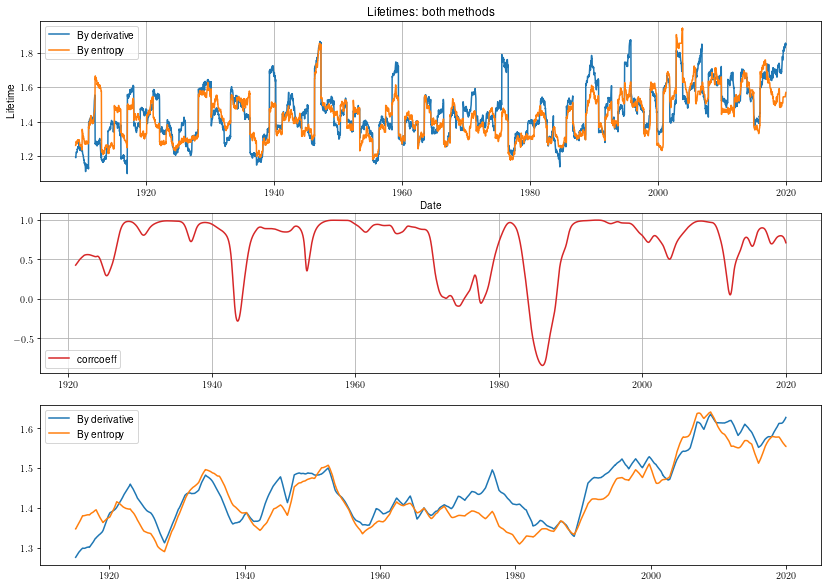

In [53]:
plot_all3(data_DeKooy, window=365, predicate=lambda month: (month>2) & (month<5))

## Разные станции летом

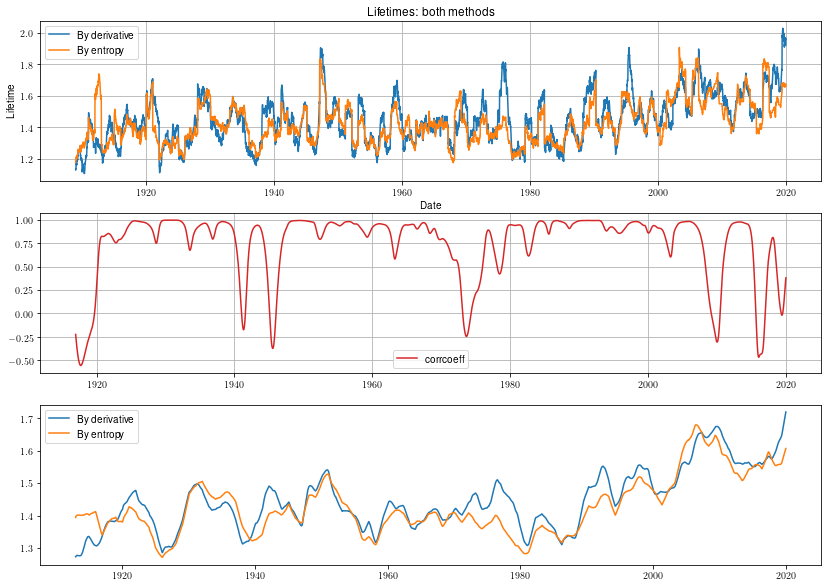

In [54]:
plot_all3(data_DeKooy, window=365, predicate=lambda month: (month>5) & (month<9))

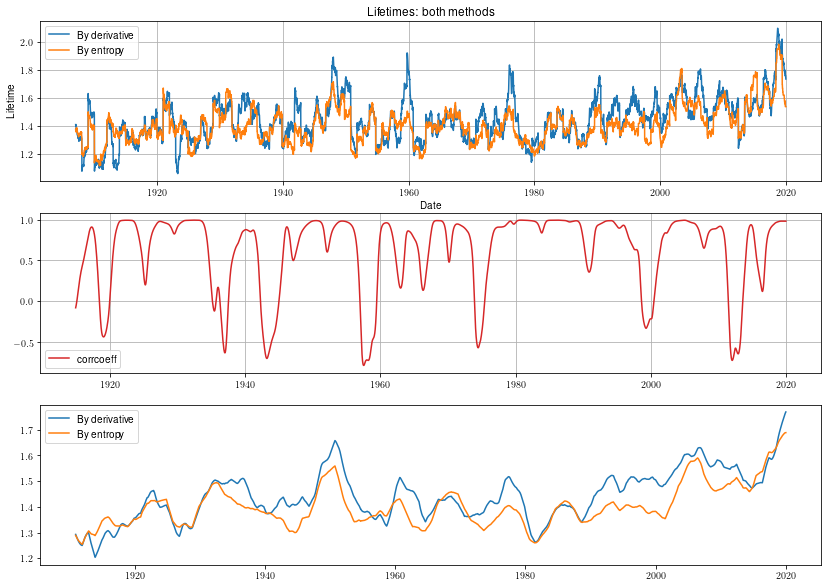

In [55]:
plot_all3(data_Maastricht, window=365, predicate=lambda month: (month>5) & (month<9))

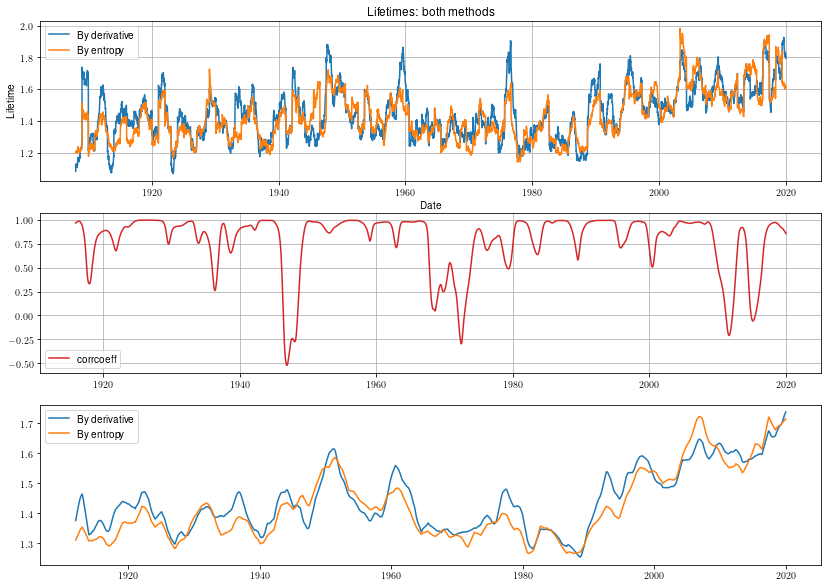

In [56]:
plot_all3(data_Vlissingen, window=365, predicate=lambda month: (month>5) & (month<9))

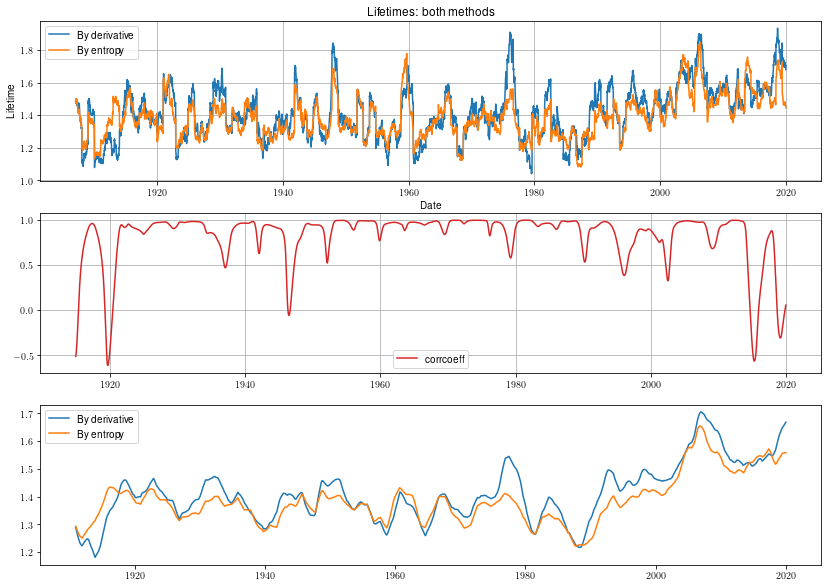

In [57]:
plot_all3(data_Eelde, window=365, predicate=lambda month: (month>5) & (month<9))

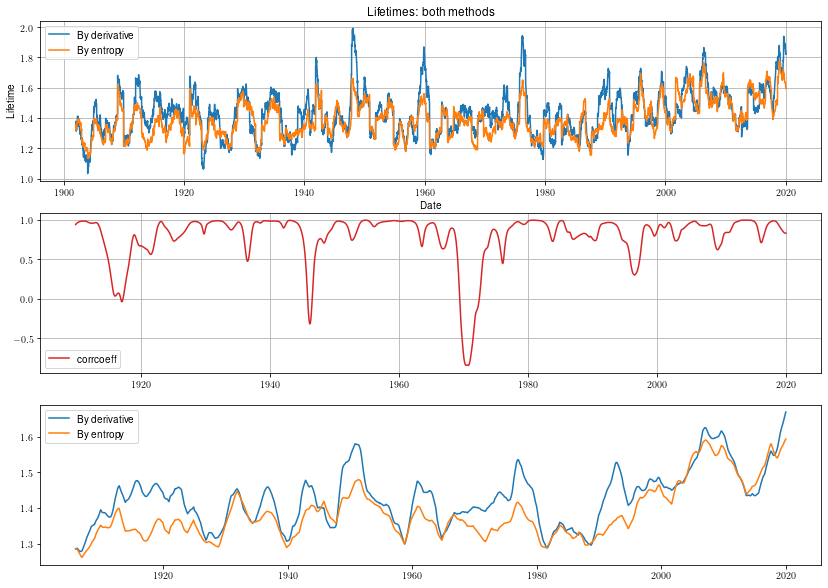

In [58]:
plot_all3(data, window=365, predicate=lambda month: (month>5) & (month<9))

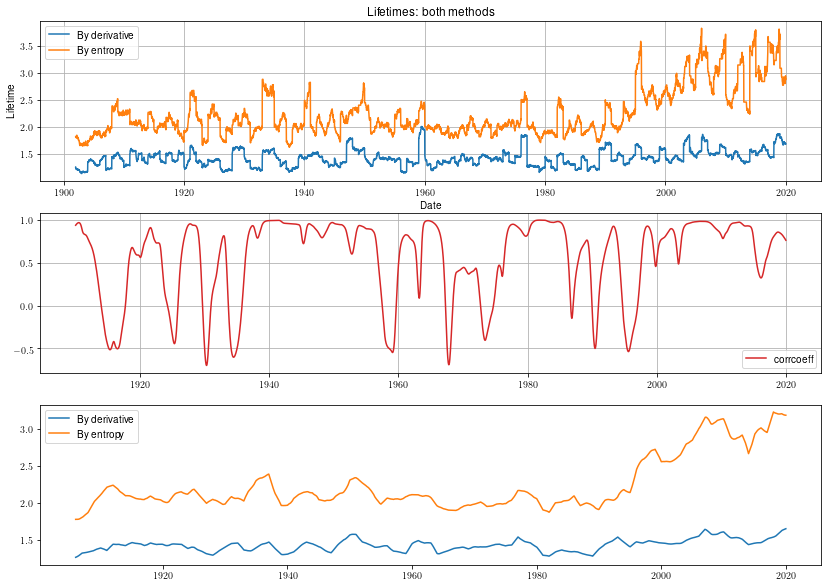

In [80]:
plot_all3(data, window=365, predicate=lambda month: (month>8) & (month<12))

TODO:
- попробовать научить меры учитывать длину светового дня. Брать процент от общего светового дня
- изменять границу для MRC, изменяя ее в зависимости от времени года

In [96]:
# https://www.weather-atlas.com/en/netherlands/amsterdam-climate#daylight_sunshine
# AVERAGE DAYLIGHT FOR ALL MONTHS:
daylight = {}
daylight[1] = 8.3
daylight[2] = 9.9
daylight[3] = 11.0
daylight[4] = 14
daylight[5] = 15.8
daylight[6] = 16.7
daylight[7] = 16.2
daylight[8] = 14.6
daylight[9] = 12.6
daylight[10] = 10.6
daylight[11] = 8.8
daylight[12] = 7.8

In [97]:
data_rel = data.copy(deep=True)
data_rel['val'] = data_rel.apply(lambda row: row['val']/daylight[row['month']], axis=1)

In [98]:
data_rel

,year,month,day,val
0,1901,1,3,0.000000
1,1901,1,4,0.000000
2,1901,1,5,0.433735
3,1901,1,6,0.734940
4,1901,1,7,0.337349
...,...,...,...,...
43615,2020,7,2,0.351852
43616,2020,7,3,0.456790
43617,2020,7,4,0.006173
43618,2020,7,5,0.246914


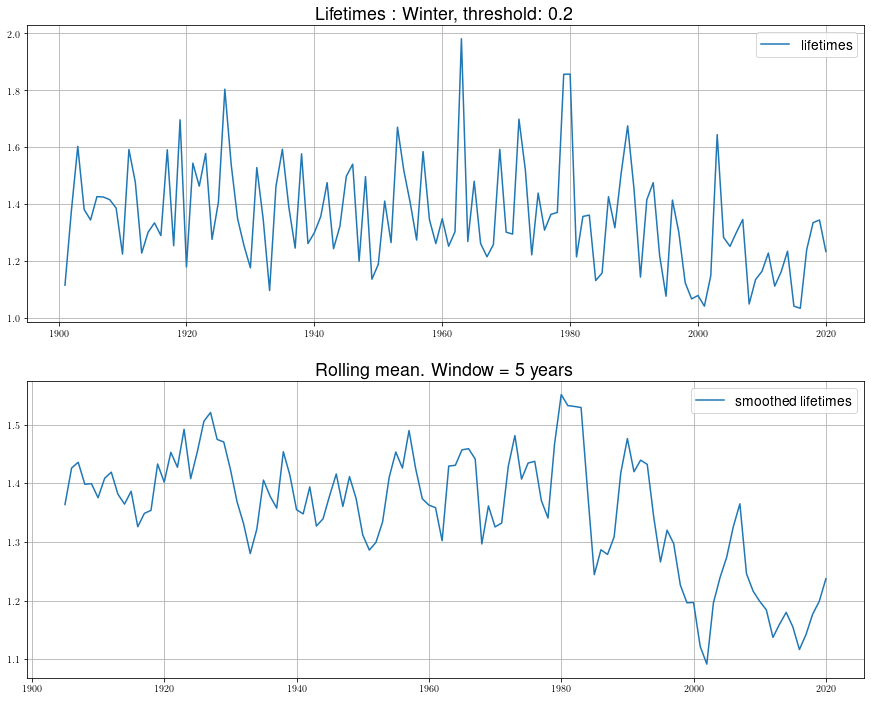

In [99]:
# image get_lifetime_by_predicate-date_rel-02-winter
get_lifetime_by_predicate(data_rel, 0.2, lambda month: (month < 3) | (month == 12), "Winter")

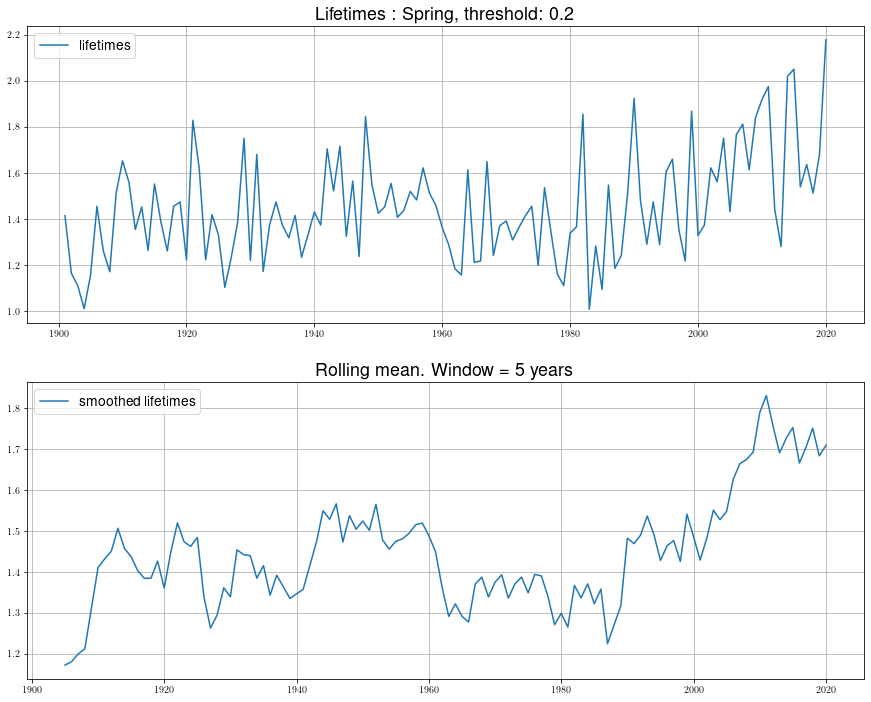

In [100]:
# image get_lifetime_by_predicate-date_rel-02-spring
get_lifetime_by_predicate(data_rel, 0.2, lambda month: (month > 2) & (month < 6), "Spring")

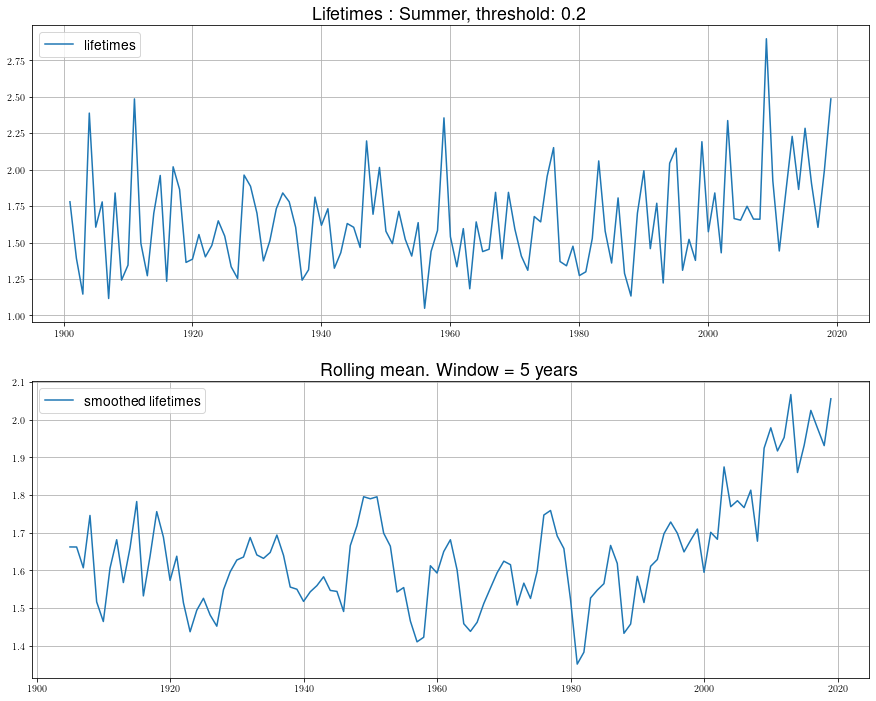

In [101]:
# image get_lifetime_by_predicate-date_rel-02-summer
get_lifetime_by_predicate(data_rel, 0.2, lambda month: (month > 5) & (month < 9), "Summer")

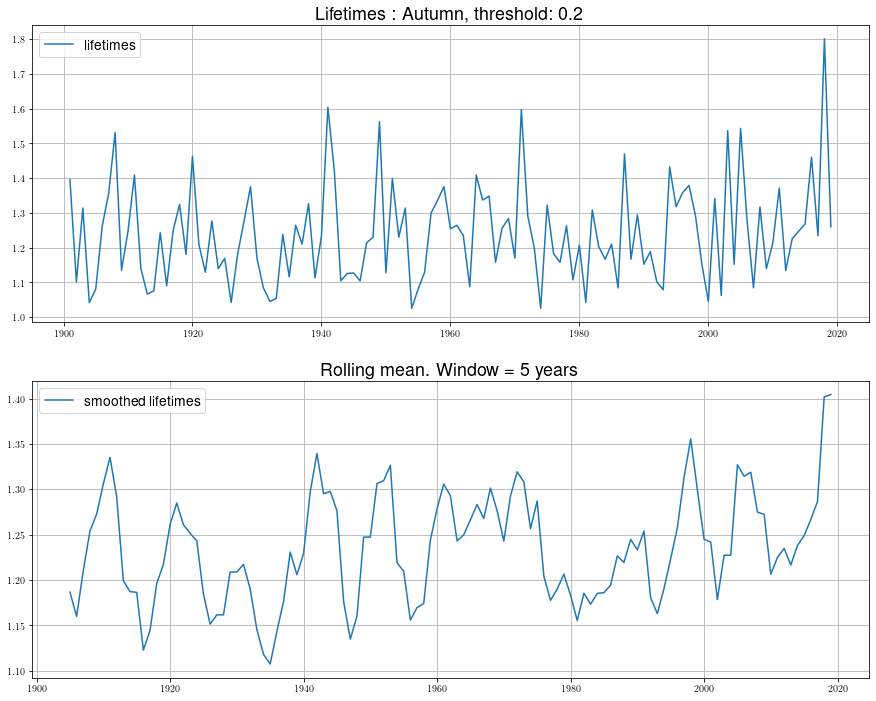

In [103]:
# image get_lifetime_by_predicate-date_rel-02-autumn
get_lifetime_by_predicate(data_rel, 0.2, lambda month: (month > 8) & (month < 12), "Autumn")

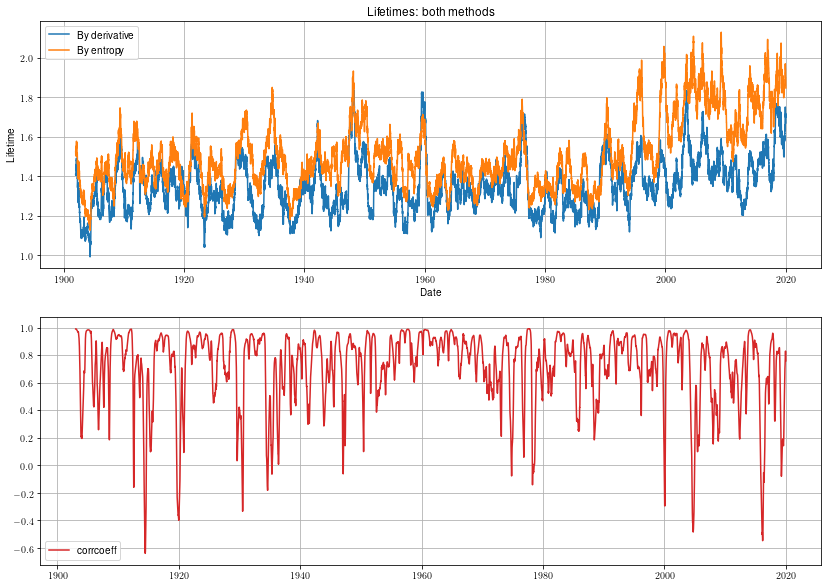

In [63]:
SUNNY_THRESHOLD = 0.1
plot_all(data_rel, window=365)

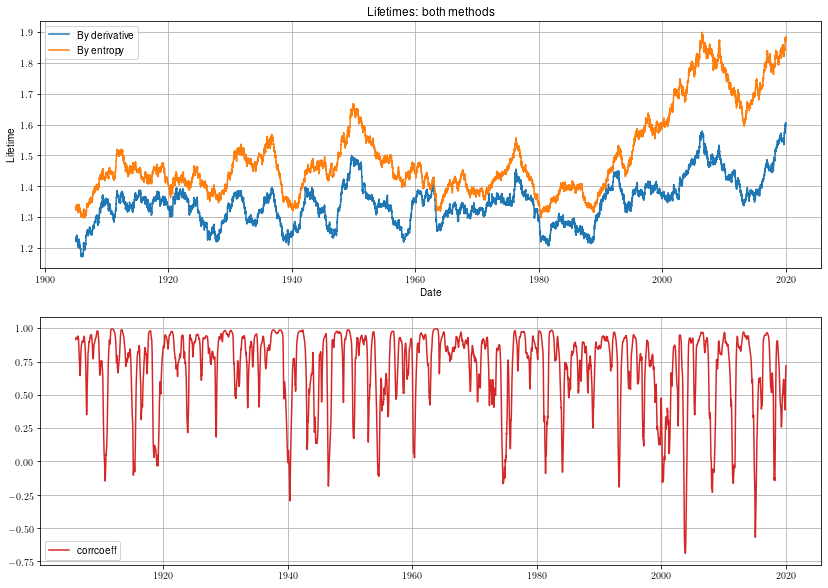

In [64]:
SUNNY_THRESHOLD = 0.1
plot_all(data_rel, window=365*4)

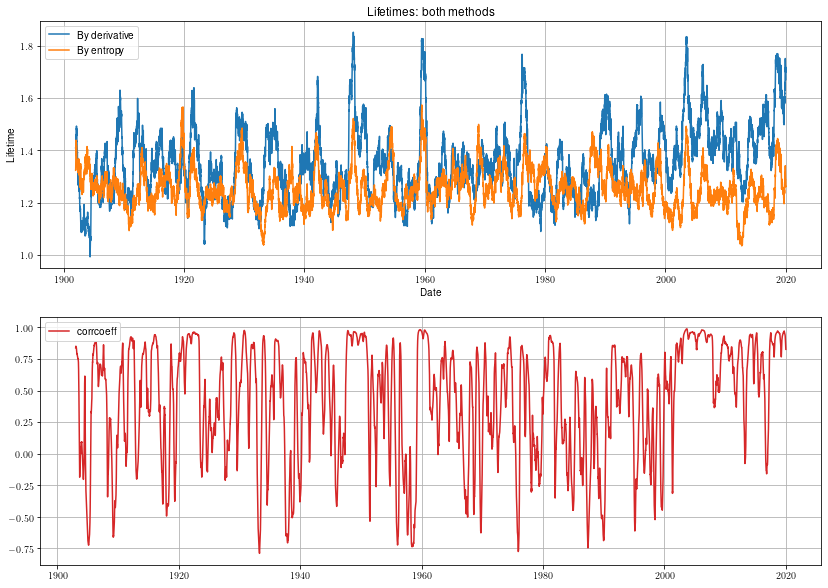

In [66]:
SUNNY_THRESHOLD = 0.3
plot_all(data_rel, window=365)

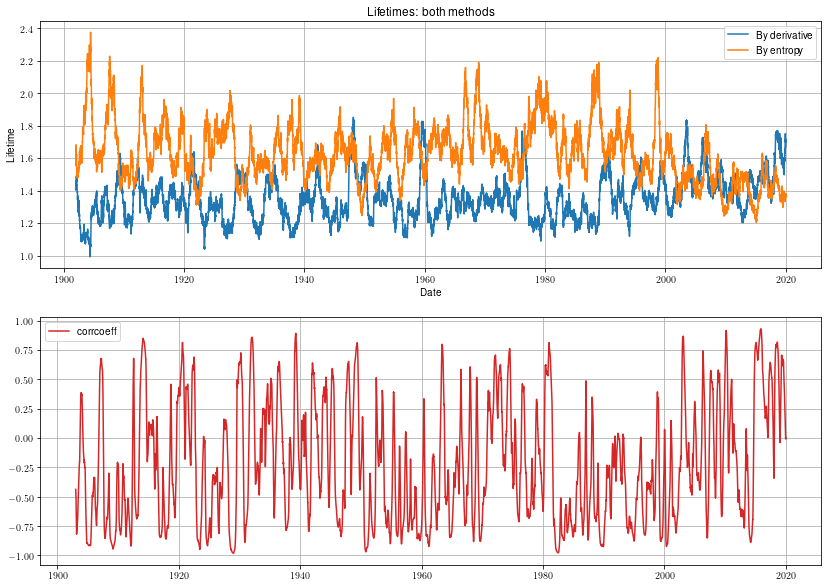

In [67]:
SUNNY_THRESHOLD = 0.5
plot_all(data_rel, window=365)

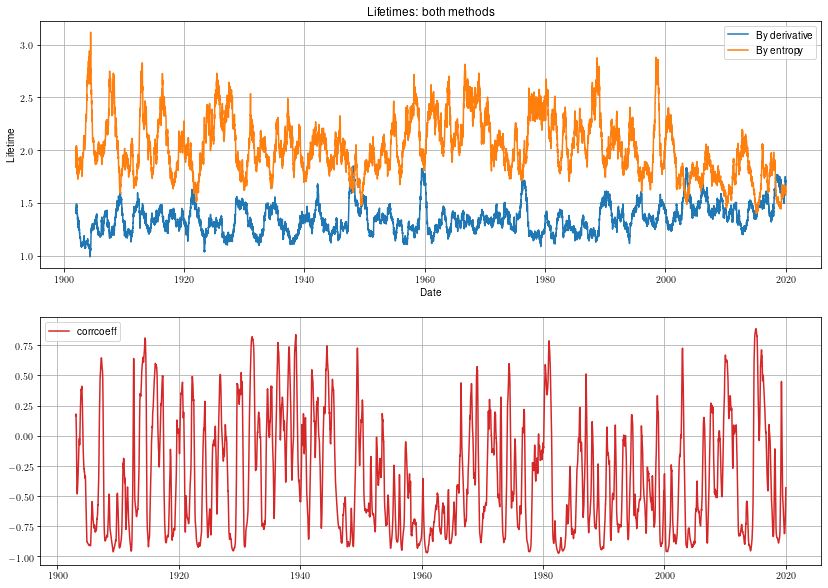

In [68]:
SUNNY_THRESHOLD = 0.6
plot_all(data_rel, window=365)

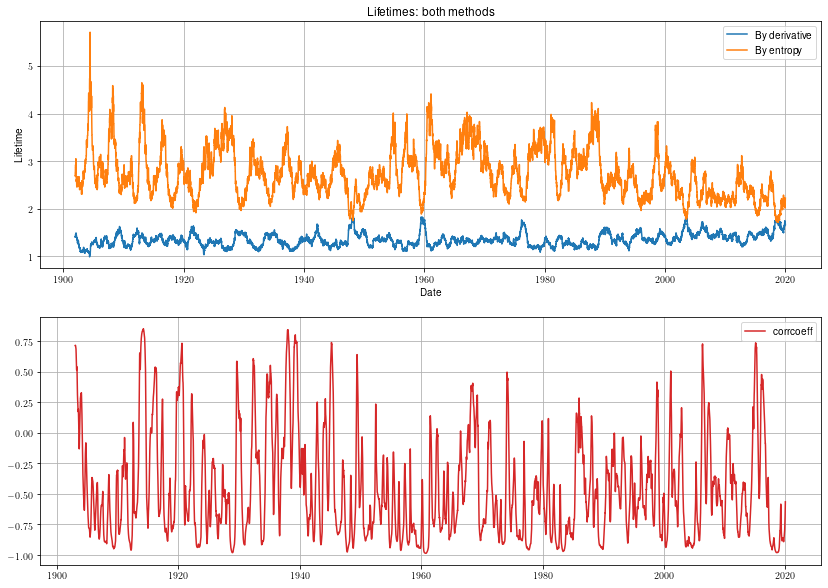

In [69]:
SUNNY_THRESHOLD = 0.7
plot_all(data_rel, window=365)

In [74]:
data_rel_Vlissingen = data_Vlissingen.copy(deep=True)
data_rel_Vlissingen['val'] = data_rel_Vlissingen.apply(lambda row: row['val']/daylight[row['month']], axis=1)

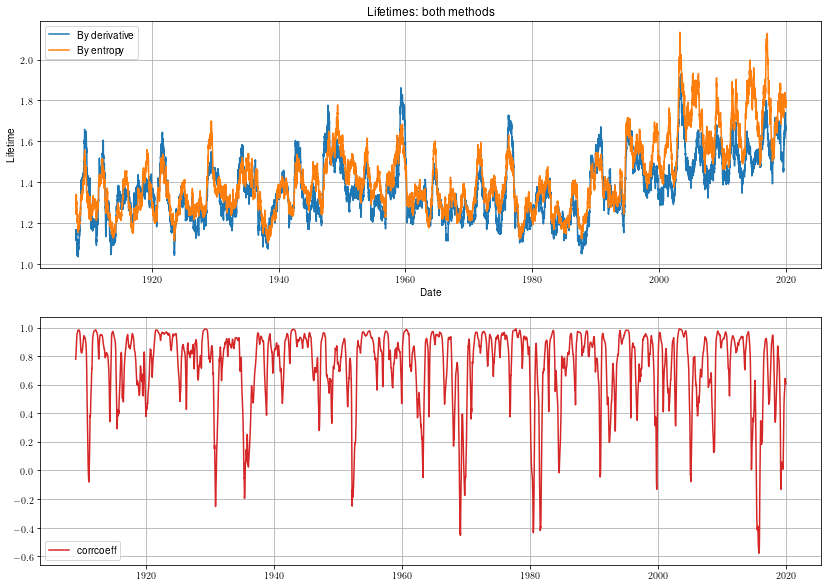

In [77]:
SUNNY_THRESHOLD = 0.15
plot_all(data_rel_Vlissingen, window=365)

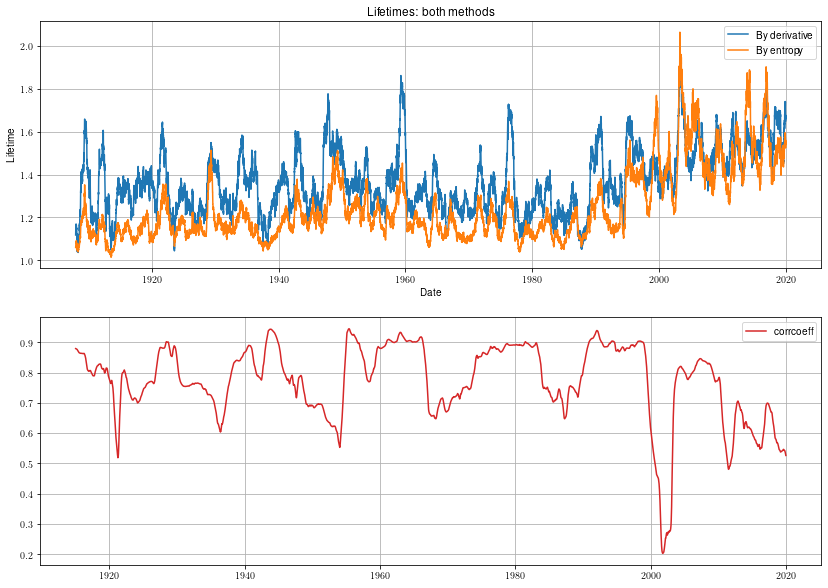

In [ ]:
# image plot_all3-data_rel_Vlissingen-01-365
SUNNY_THRESHOLD = 0.1
plot_all3(data_rel_Vlissingen, window=365, corr_window=365*7)

In [78]:
data_rel_DeKooy = data_DeKooy.copy(deep=True)
data_rel_DeKooy['val'] = data_rel_DeKooy.apply(lambda row: row['val']/daylight[row['month']], axis=1)

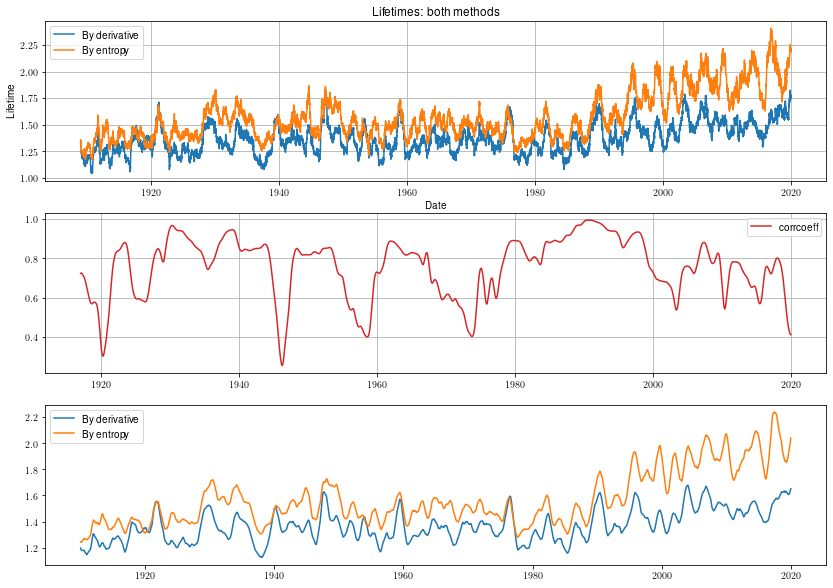

In [79]:
# image plot_all3-data_rel_DeKooy-01-365
SUNNY_THRESHOLD = 0.1
plot_all3(data_rel_DeKooy, window=365, corr_window=365*7)

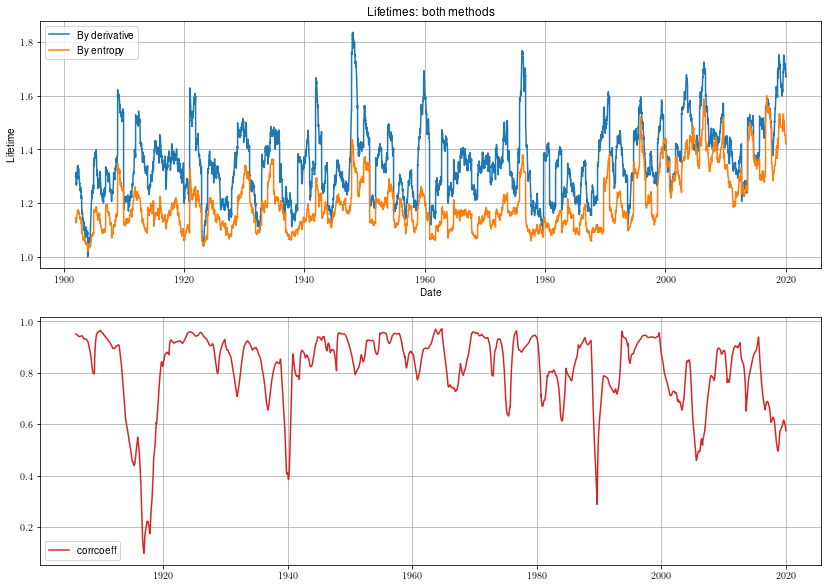

In [ ]:
plot_all3(data_rel, window=365, predicate=lambda month: (month>5) & (month<9))

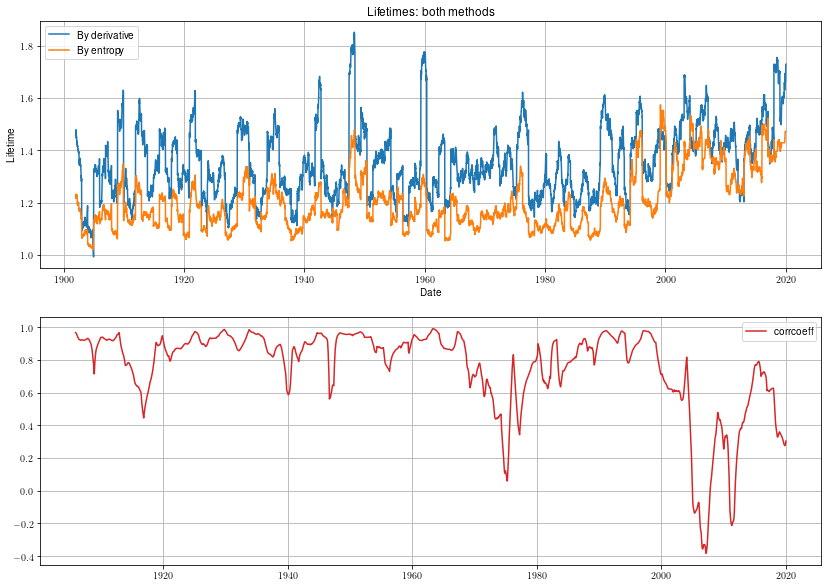

In [ ]:
plot_all3(data_rel, window=365, predicate=lambda month: (month>2) & (month<6))

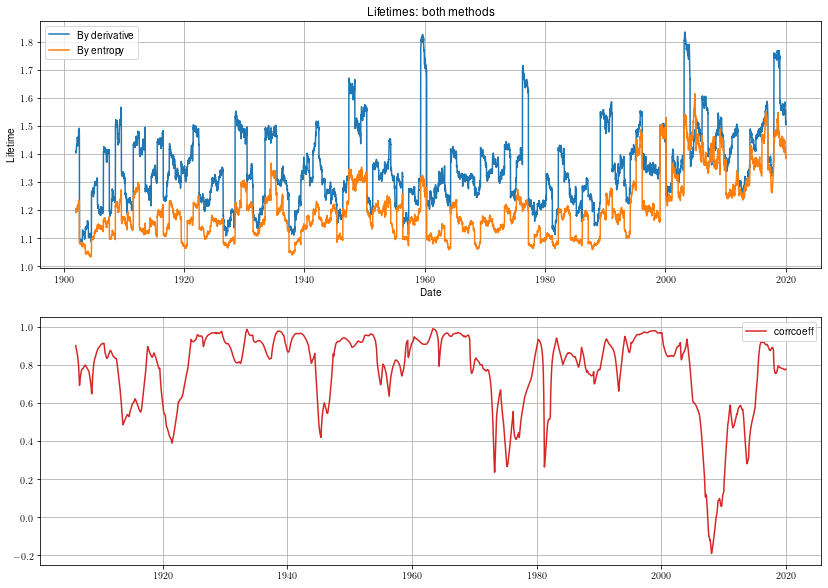

In [ ]:
plot_all3(data_rel, window=365, predicate=lambda month: (month==12) | (month<3))

In [ ]:
data_no_zeros = data.copy(deep=True)
data_no_zeros['val'] = data['val'].rolling(6).sum()
data_no_zeros = data_no_zeros.loc[6:]
data_no_zeros = data_no_zeros.reset_index(drop=True)

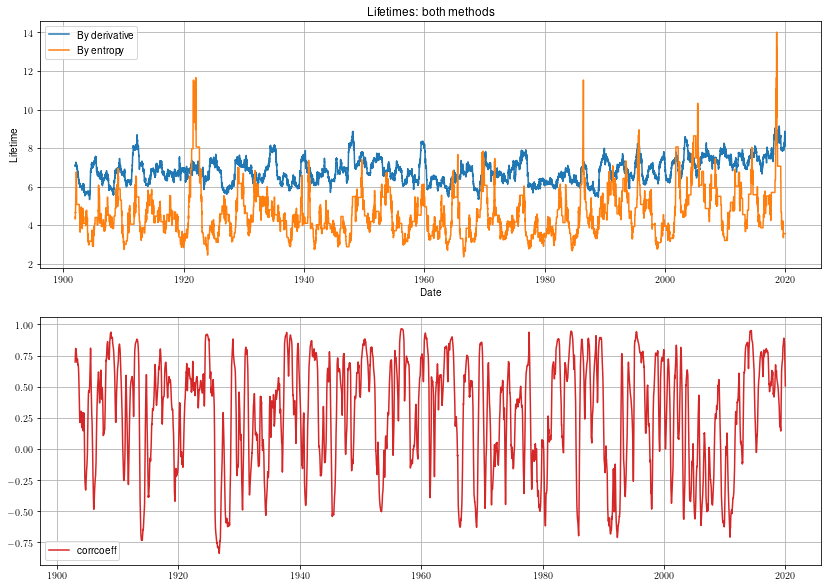

In [ ]:
SUNNY_THRESHOLD = 10
plot_all(data_no_zeros, window=365)

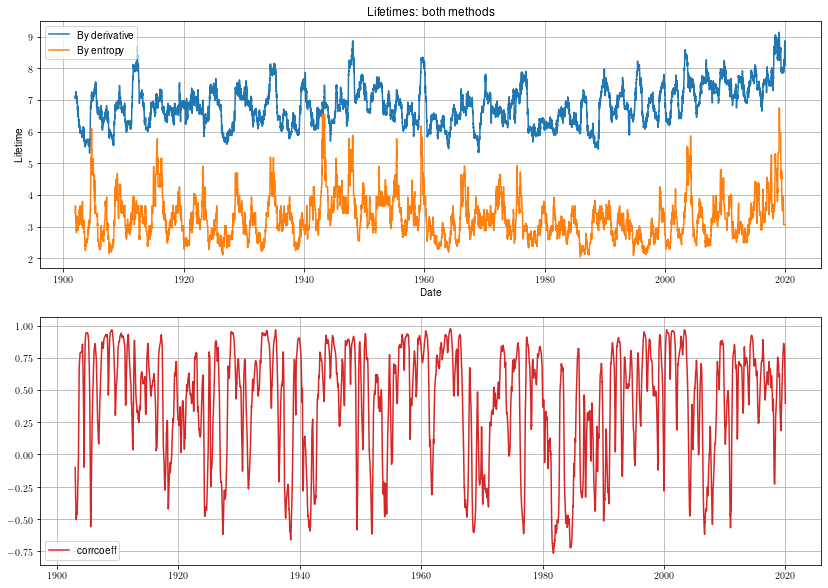

In [ ]:
SUNNY_THRESHOLD = 20
plot_all(data_no_zeros, window=365)

## Ветер
http://climexp.knmi.nl/getdutchdx.cgi?id=someone@somewhere&WMO=260&STATION=De_Bilt&extraargs=
x-компонента зонального ветра

In [59]:
wind = pd.read_csv('../winds/Debilt_wind.dat')

In [60]:
wind = wind.drop(columns='Unnamed: 0')

In [61]:
wind

,val,day,month,year,val_x,val_y
0,-2.498092,1,1,1904,-0.80,-0.60
1,2.879707,2,1,1904,-0.97,0.26
2,2.597760,3,1,1904,-0.86,0.52
3,2.306590,4,1,1904,-0.67,0.74
4,-2.709185,5,1,1904,-0.91,-0.42
...,...,...,...,...,...,...
42668,1.671465,25,11,2020,-0.10,0.99
42669,-2.879707,26,11,2020,-0.97,-0.26
42670,-2.879707,27,11,2020,-0.97,-0.26
42671,-3.001110,28,11,2020,-0.99,-0.14


In [62]:
wind.mean()

val         0.127115
day        15.729501
month       6.520540
year     1961.968458
val_x       0.165854
val_y       0.144478
dtype: float64

In [63]:
wind.max()

val         3.141593
day        31.000000
month      12.000000
year     2020.000000
val_x       1.000000
val_y       1.000000
dtype: float64

In [64]:
wind.min()

val        -3.121595
day         1.000000
month       1.000000
year     1904.000000
val_x      -1.000000
val_y      -1.000000
dtype: float64

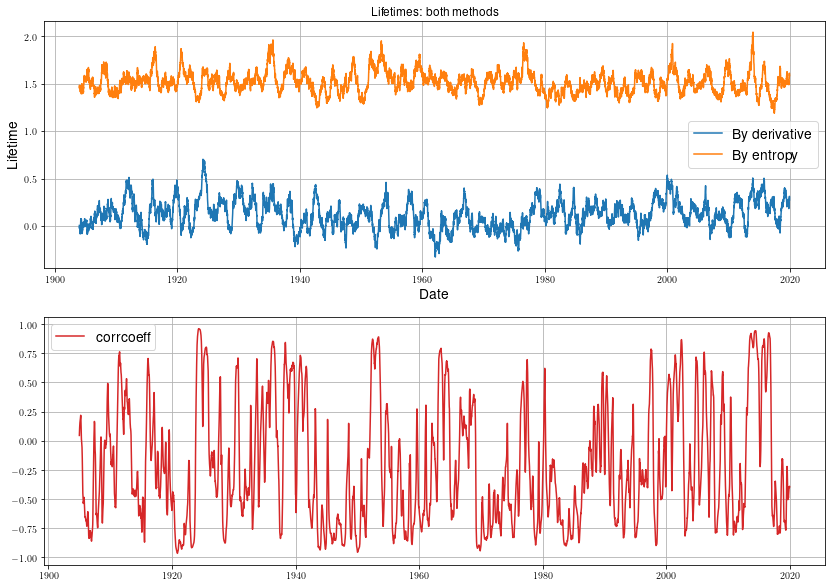

In [65]:
SUNNY_THRESHOLD=0.5
plot_all(wind, window=365)

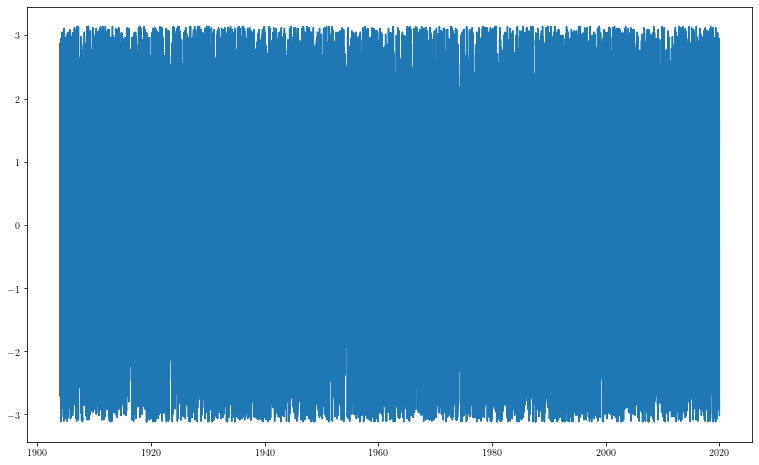

In [66]:
dates = np.linspace(wind['year'].min(), wind['year'].max(), wind.shape[0])
plt.figure(figsize=(13, 8))
plt.plot(dates, wind['val'])

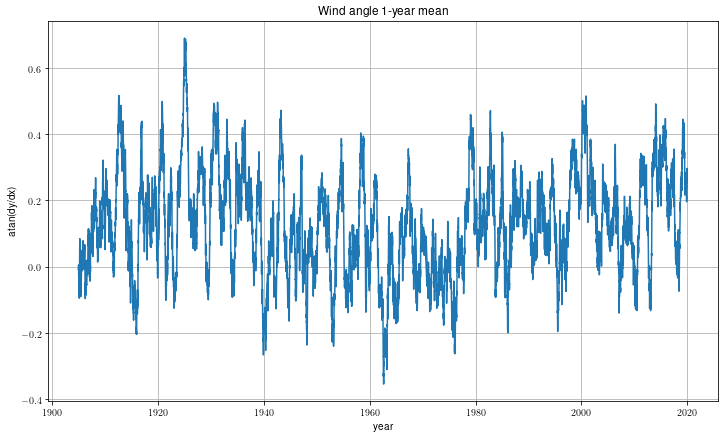

In [67]:
plt.figure(figsize=(12, 7))
window = 365
plt.title('Wind angle {}-year mean'.format(window // 365))
plt.xlabel('year')
plt.ylabel('atan(dy/dx)')
plt.grid(True)
plt.plot(dates, wind['val'].rolling(365).mean())

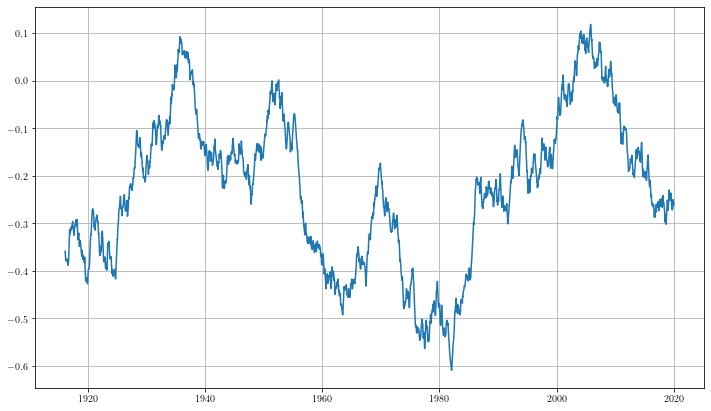

In [68]:
plt.figure(figsize=(12, 7))
plt.grid(True)
data = wind[wind['month']==4]['year']

plt.plot(np.linspace(data.min(), data.max(), data.size), wind[wind['month']==4]['val'].rolling(365).mean())

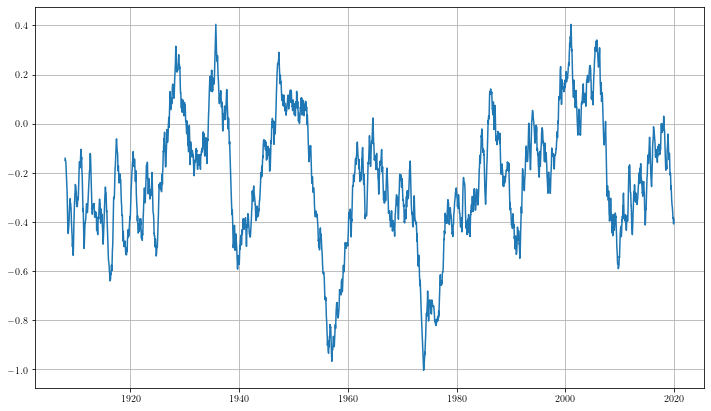

In [69]:
plt.figure(figsize=(12, 7))
plt.grid(True)
data = wind[wind['month']==4]['year']

plt.plot(np.linspace(data.min(), data.max(), data.size), wind[wind['month']==4]['val'].rolling(120).mean())

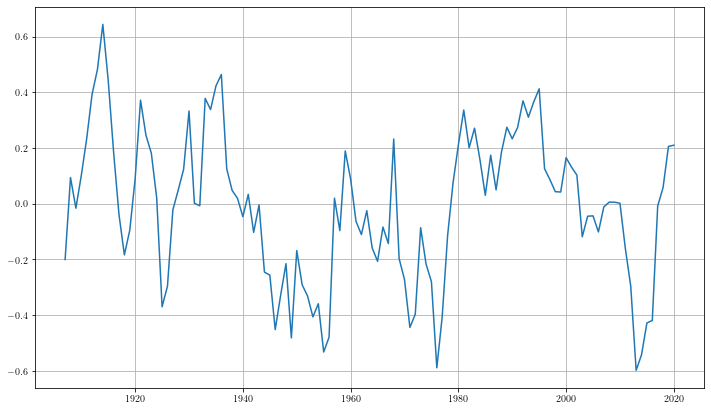

In [90]:
plt.figure(figsize=(12, 7))
plt.grid(True)
data = wind[wind['month']==3]
data = data.groupby('year').mean()[['val']]
#data
plt.plot(list(data.index), data['val'].rolling(4).mean())

1. оформить про среднее в феврале
2. посчитать нормально среднее по компонентам
3. посмотреть данные по скорости ветра

In [104]:
speed = pd.read_csv('../winds/Debilt_wind.dat')
speed = speed.drop(columns='Unnamed: 0')

In [115]:
data = pd.DataFrame()
window = 30
data['val_x'] = speed['val_x'].rolling(window).mean()
data['val_y'] = speed['val_y'].rolling(window).mean()
data['dir'] = np.arctan2(data['val_y'], data['val_x'])
data['day'] = speed['day']
data['month'] = speed['month']
data['year'] = speed['year']
data = data.loc[window - 1 : , :]
data = data.reset_index(drop=True)

In [116]:
data2 = pd.DataFrame()
data2['val_x'] = speed['val_x']
data2['val_y'] = speed['val_y']
data2['dir'] = np.arctan2(data['val_y'], data['val_x'])
data2['day'] = speed['day']
data2['month'] = speed['month']
data2['year'] = speed['year']

In [156]:
def draw_selected_direction(angle, data, window=365, title='', plot_entropy=True):
    #angle = np.arctan2(y, x)
    eps = -np.pi/4
    data['val'] = np.abs(data['dir'] - angle)
    f = lambda z : 2 * np.pi - z if z > np.pi else z
    data['val'] = -data['val'].apply(f)
    SUNNY_THRESHOLD = eps
    plot_all(data, window=365, plot_entropy=plot_entropy, corr_window=50)

def draw_selected_direction_predicate(angle, data, window=365, predicate = lambda t : True, title=''):
    #angle = np.arctan2(y, x)
    eps = -np.pi/16
    data['val'] = np.abs(data['dir'] - angle)
    f = lambda z : 2 * np.pi - z if z > np.pi else z
    data['val'] = -data['val'].apply(f)
    get_lifetime_by_predicate(data, eps, predicate, title)

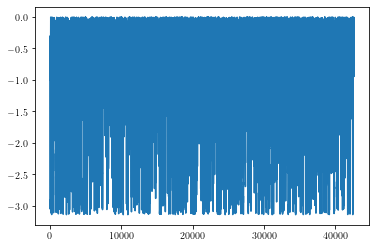

In [144]:
plt.plot(data['val'])

/Users/promanchenko/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater_equal
  """


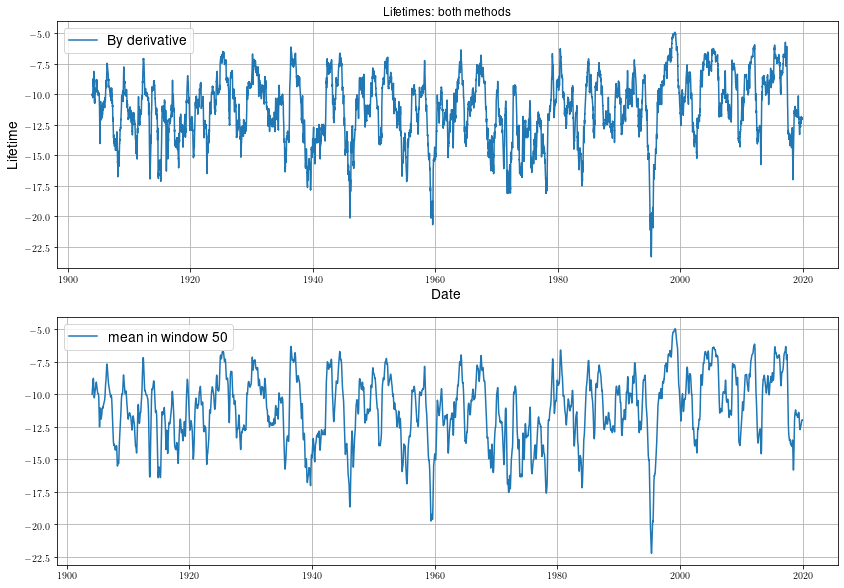

In [153]:
draw_selected_direction(np.pi / 4, data2, plot_entropy=False)

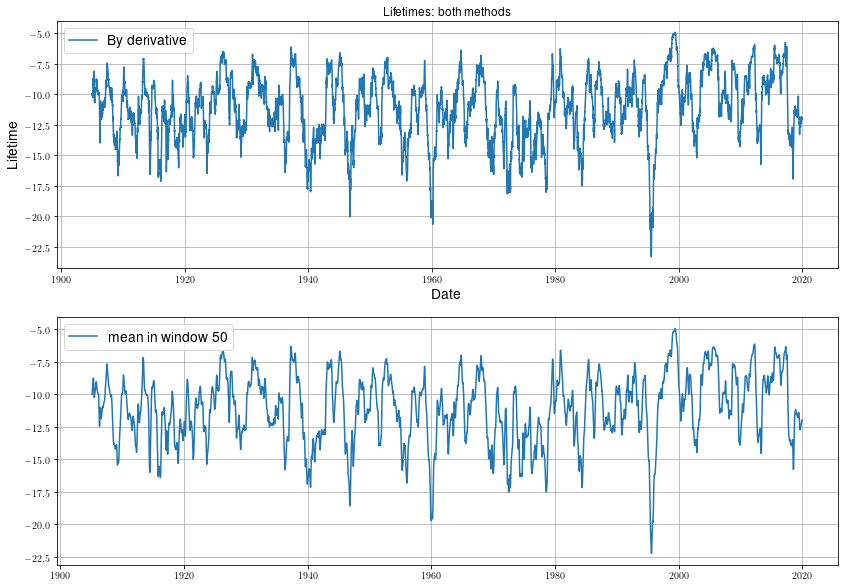

In [154]:
draw_selected_direction(np.pi / 4, data, plot_entropy=False)

/Users/promanchenko/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater_equal
  """


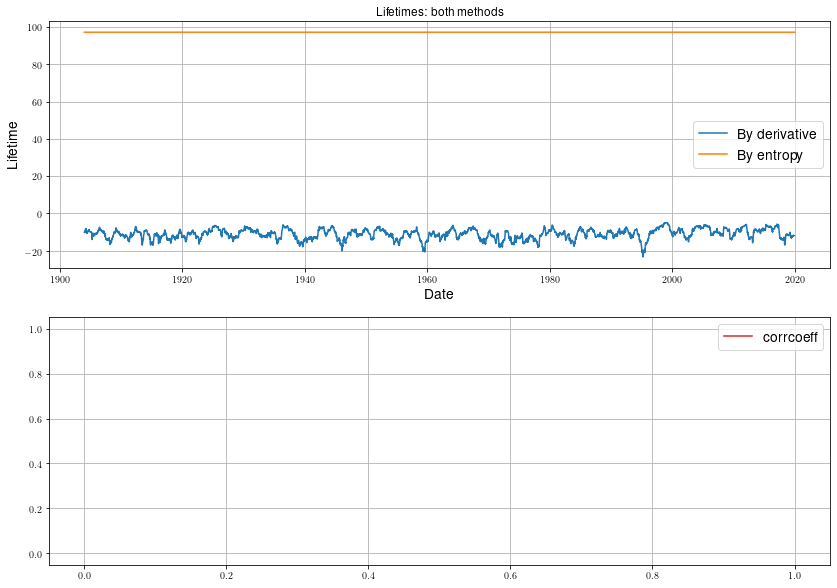

In [157]:
draw_selected_direction(np.pi / 4, data2)

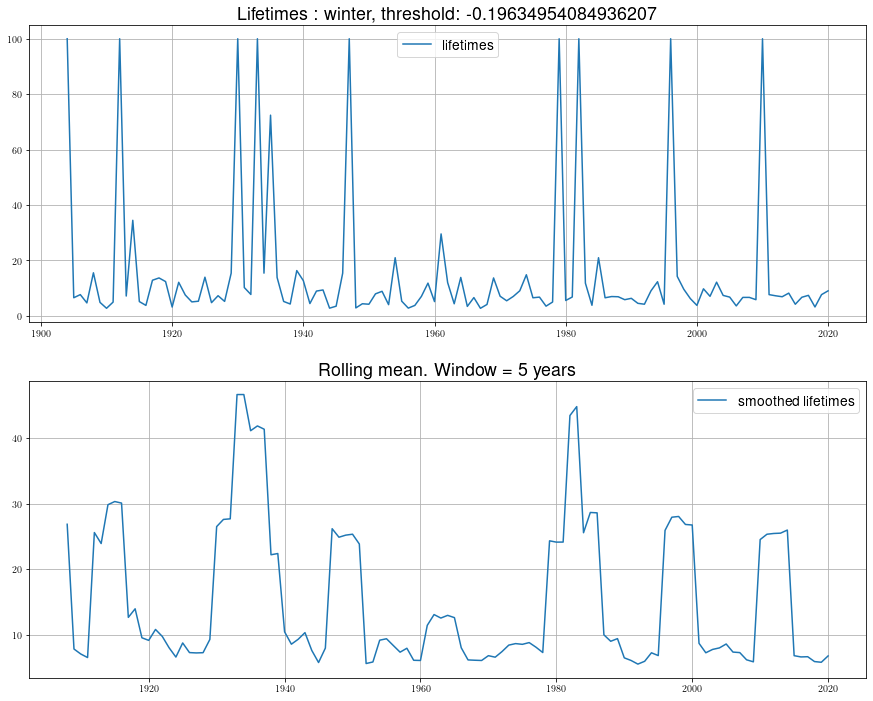

In [125]:
draw_selected_direction_predicate(np.pi / 4, data, title='winter', predicate=lambda x : (x==12) | (x < 3))

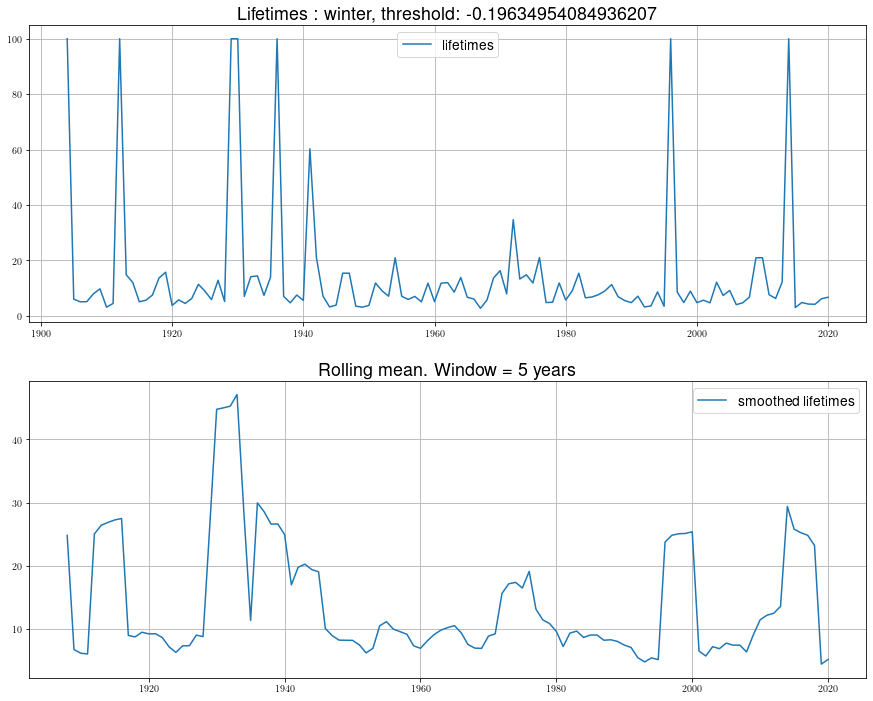

In [126]:
draw_selected_direction_predicate(np.pi / 4, data2, title='winter', predicate=lambda x : (x==12) | (x < 3))

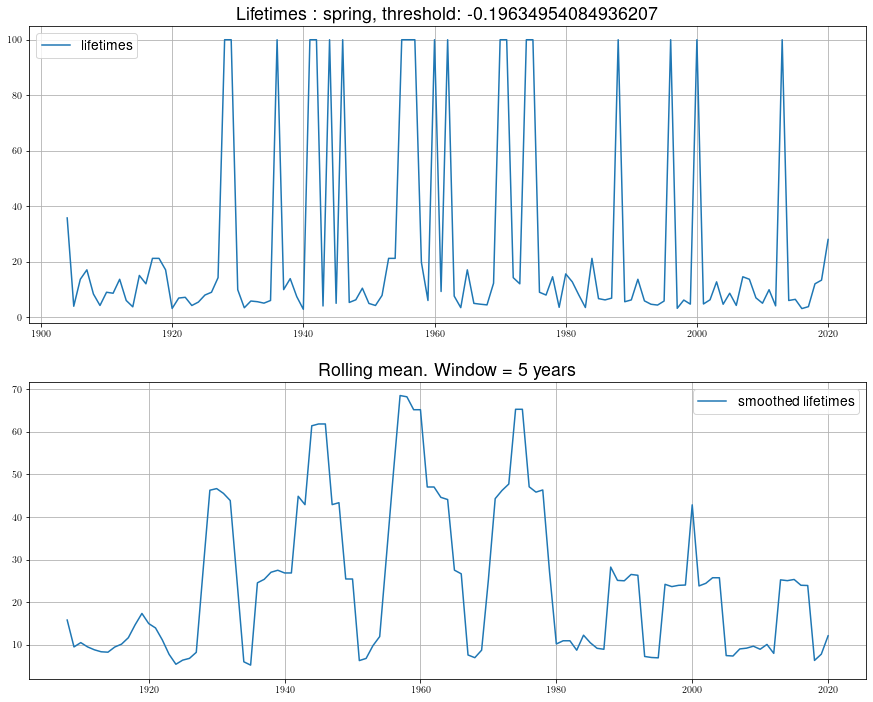

In [128]:
draw_selected_direction_predicate(np.pi / 4, data, title='spring', predicate=lambda x : (x < 6) & (x > 2))

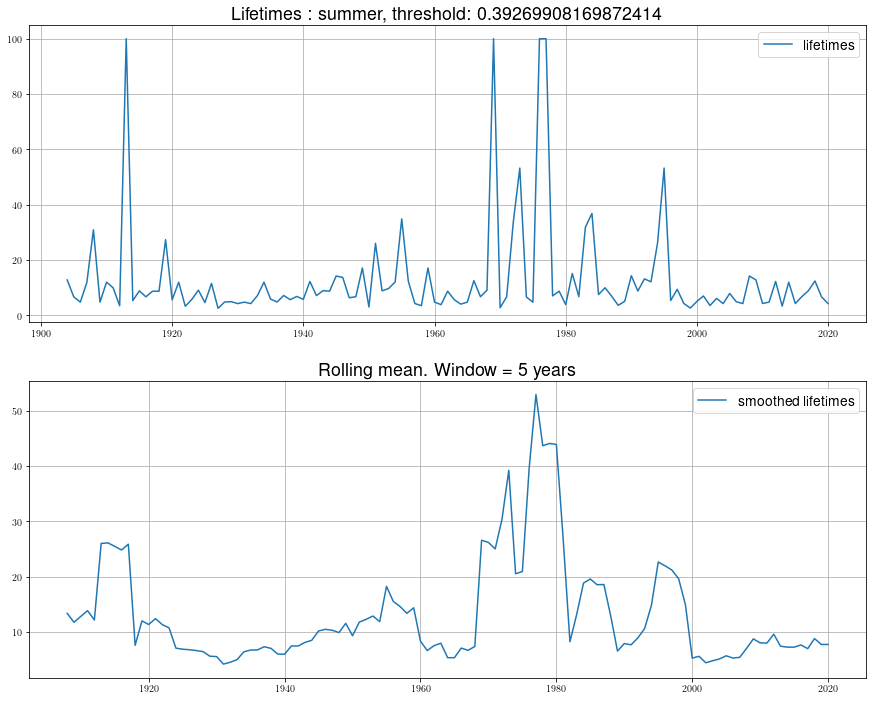

In [120]:
draw_selected_direction_predicate(np.pi / 4, data2, title='summer', predicate=lambda x : (x > 5) & (x < 9))

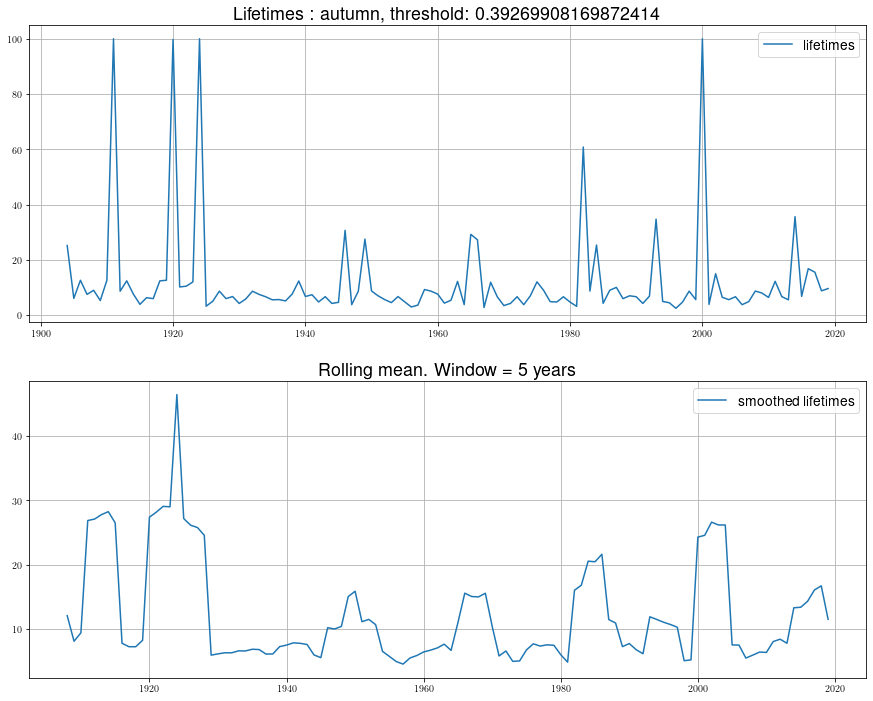

In [121]:
draw_selected_direction_predicate(np.pi / 4, data2, title='autumn', predicate=lambda x : (x > 8) & (x < 12))

посмотреть на изменение медианы
посмотреть на соотношение нулей и единиц в чистом виде
дебажить код

In [62]:
speed_rev['val'].mean()

0.19666679610780904

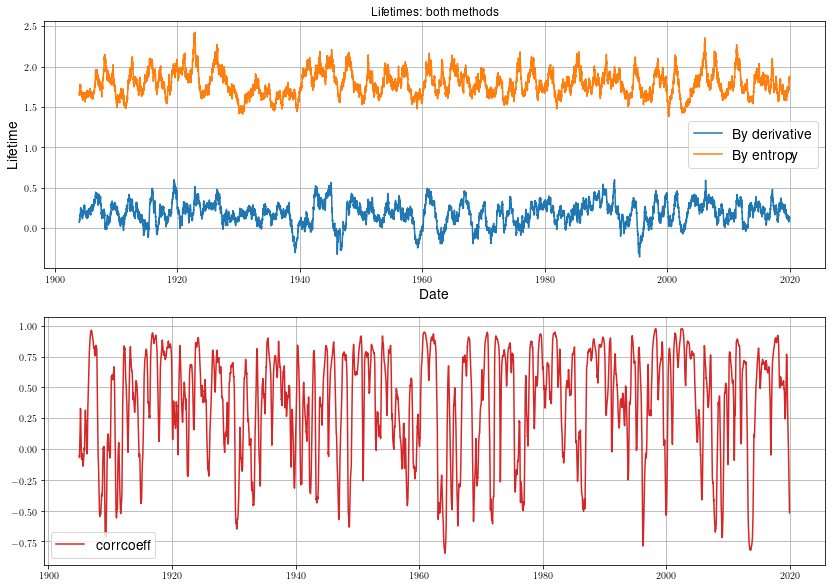

In [64]:
SUNNY_THRESHOLD=0
plot_all(speed_rev, window=365)

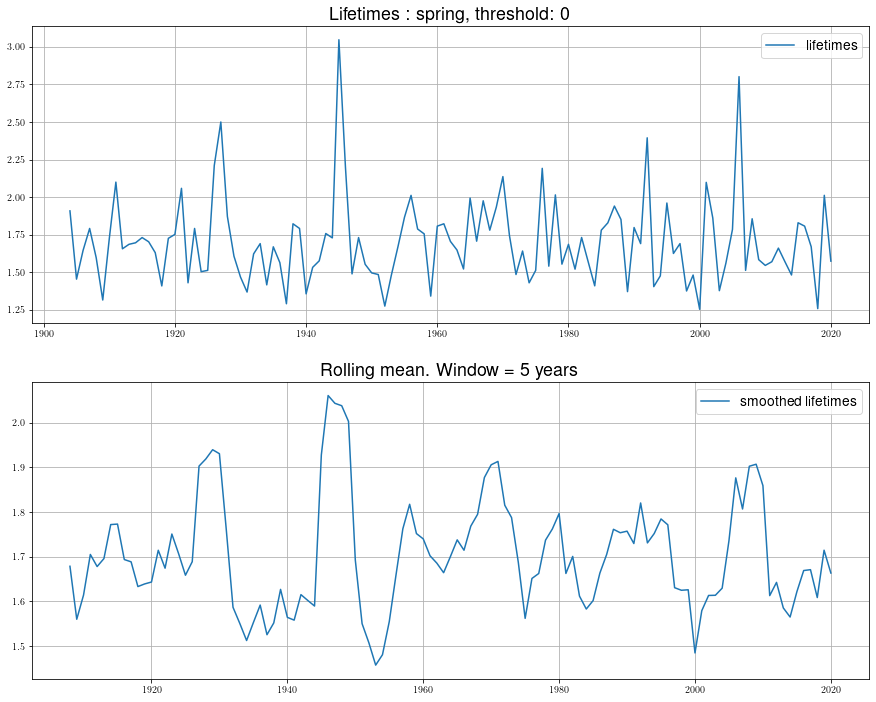

In [68]:
get_lifetime_by_predicate(speed_rev, 0, lambda x : (x>2) & (x<6), 'spring')

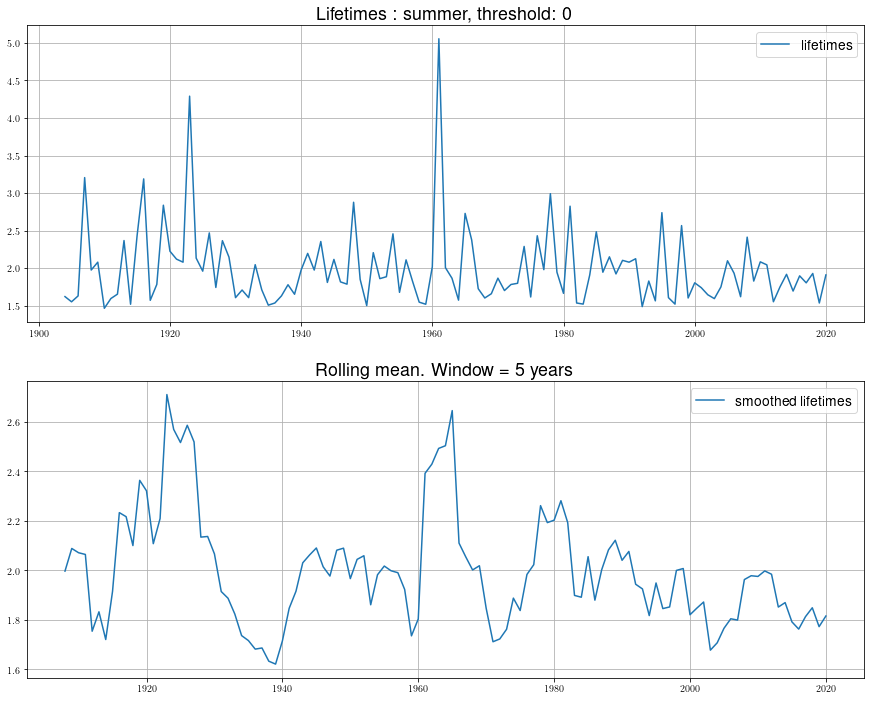

In [69]:
get_lifetime_by_predicate(speed_rev, 0, lambda x : (x>5) & (x<9), 'summer')

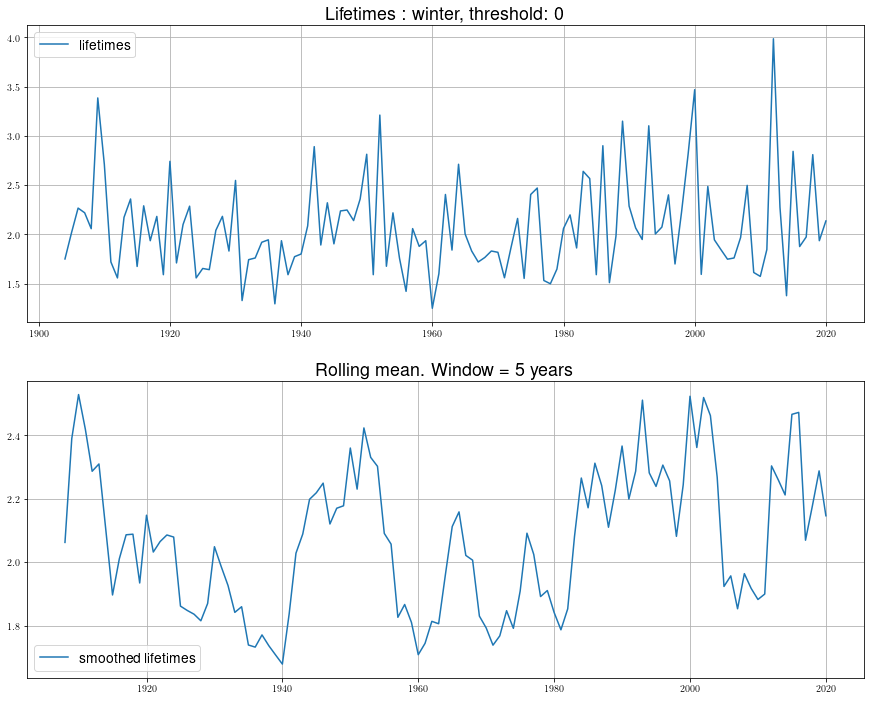

In [75]:
get_lifetime_by_predicate(speed_rev, 0, lambda x : (x==12) | (x<3), 'winter')

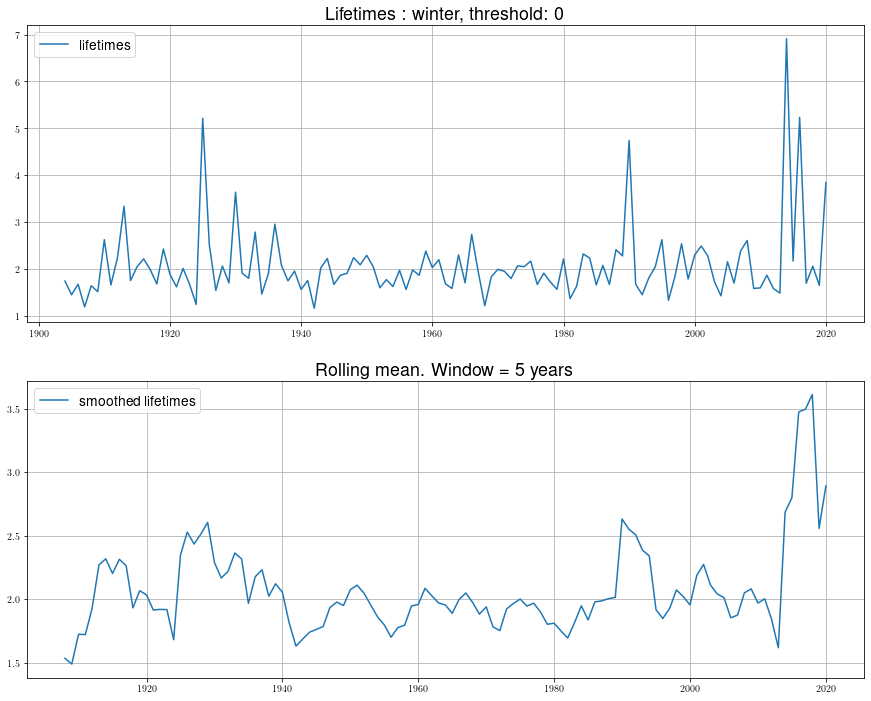

In [71]:
get_lifetime_by_predicate(speed, 0, lambda x : (x==12) | (x<3), 'winter')

In [77]:
speed_rev['val'].mean()

0.19666679610780904

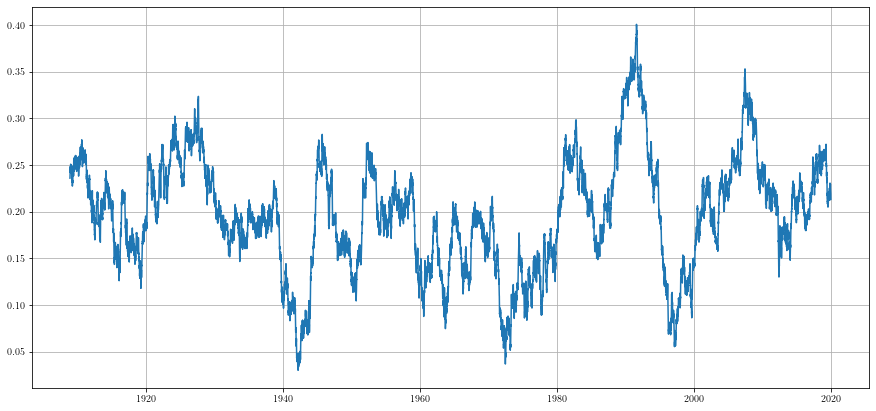

In [73]:
plt.figure(figsize=(15, 7))
plt.grid(True)
plt.plot(np.linspace(speed_rev['year'].min(), speed_rev['year'].max(), speed_rev['year'].size), speed_rev['val'].rolling(365 * 5).mean())